In [1]:
import torch

if torch.cuda.is_available():
    print("CUDA is available!")
    device = torch.device('cuda')
else:
    print("CUDA is not available. Using CPU.")
    device = torch.device('cpu')

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

import os
import json
import pickle

import tkinter as tk
import pandas as pd
import cv2
import torch
import torchvision

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler

CUDA is not available. Using CPU.


import torch: Импортирует библиотеку PyTorch для работы с нейронными сетями.
Определение устройства (device):
Проверяет, доступна ли CUDA (GPU) с помощью torch.cuda.is_available().
Если CUDA доступна, устанавливает device на 'cuda', чтобы использовать GPU.
Иначе, устанавливает device на 'cpu', чтобы использовать CPU.
Импорт библиотек: Импортирует необходимые библиотеки для:
Численных вычислений (numpy).
Визуализации (matplotlib.pyplot).
Работы с файловой системой (os).
Работы с данными в формате JSON (json) и pickle (pickle).
Создания графического интерфейса (tkinter).
Работы с табличными данными (pandas).
Обработки изображений (cv2).
Дополнительных модулей PyTorch (torch.nn, torch.nn.functional, torch.optim, torch.optim.lr_scheduler).

In [3]:
#pip install opencv-python-headless

In [3]:
#pip install torch torchvision torchaudio


In [4]:
#pip install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cpu/torchvision-0.17.1%2Bcpu-cp310-cp310-linux_x86_64.whl

# 0.Dataset/Corresponding labels/Classifier

In [ ]:
"""
0.0 Reading mov of static image 
"""
###
if_rotate=False # Rotate 90 if needed
###
cap = cv2.VideoCapture("workspace_physical/static.mov")
frame_list=[]
while(cap.isOpened()):
    ret, frame = cap.read()
    
    if ret == True:
        if if_rotate:
            frame=cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
        frame_list.append(frame)
    else:
        break
cap.release()

В итоге, этот код читает видеофайл “workspace_physical/static.mov”, извлекает все кадры, возможно, поворачивает их, и сохраняет их в список frame_list.

True

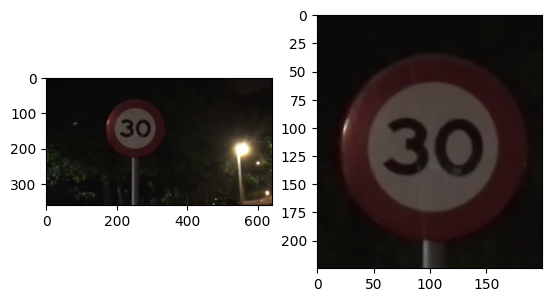

In [3]:
"""
0.1 Select bound for more quality result.
and store victim image 
"""
###
x_bound=(25,250)
y_bound=(150,350)
###

static_img=np.mean(frame_list,axis=0) # mean of multi frames to reduce noise
static_img=np.round(static_img)/255
plt.subplot(1,2,1)
plt.imshow(static_img[:,:,::-1])
plt.subplot(1,2,2)
plt.imshow(static_img[x_bound[0]:x_bound[1],y_bound[0]:y_bound[1]][:,:,::-1])

test_img=static_img[x_bound[0]:x_bound[1],y_bound[0]:y_bound[1]]
cv2.imwrite('workspace_physical/source.png', (test_img*255).astype("uint8"))

В итоге, этот код усредняет кадры из видео, обрезает область интереса, отображает исходное и обрезанное изображения, и сохраняет обрезанное изображение в файл “workspace_physical/source.png”.

In [4]:
"""
0.2 Reading dictionary of label
"""
###
DATASET="RTSD"
###
with open("params.json", "r") as config:
    params = json.load(config)
    CLASS_N = params[DATASET]["class_n"]
    LABELS = params[DATASET]["labels"]
    CLASSIFIER_INPUT_SHAPE=params[DATASET]["classifier_input_shape"]
    device = params["device"]

In [ ]:
class GTSRB_MODEL(nn.Module):
    def __init__(self, output_dim):
        """
        Initializing the model
        """

        super(GTSRB_MODEL,self).__init__()
        self.input_dim = 3*50*50
        self.output_dim = output_dim

        self.metrics = {}

        self.flatten = nn.Flatten()

        self.dropout2 = nn.Dropout(0.2)
        self.dropout3 = nn.Dropout(0.3)

        self.relu = nn.ReLU()
        self.maxpool = nn.MaxPool2d(2)

        # building layers
        self.conv1 = nn.Conv2d(in_channels=3,out_channels=32,kernel_size=3,padding=1)
        self.conv2 = nn.Conv2d(in_channels=32,out_channels=64,kernel_size=3,padding=1)
        self.batchnorm1 = nn.BatchNorm2d(64)

        self.conv3 = nn.Conv2d(in_channels=64,out_channels=128,kernel_size=3,padding=1)
        self.conv4 = nn.Conv2d(in_channels=128,out_channels=256,kernel_size=3,padding=1)
        self.batchnorm2 = nn.BatchNorm2d(256)

        self.conv5 = nn.Conv2d(in_channels=256,out_channels=512,kernel_size=3)
        self.conv6 = nn.Conv2d(in_channels=512,out_channels=1024,kernel_size=3)
        self.batchnorm3 = nn.BatchNorm2d(1024)


        self.l1 = nn.Linear(1024*4*4,512)
        self.l2 = nn.Linear(512,128)
        self.batchnorm4 = nn.LayerNorm(128)
        self.l3 = nn.Linear(128,output_dim)


    def forward(self, input):
        """
        Forward propagation...
        """

        conv = self.conv1(input)
        conv = self.conv2(conv)
        batchnorm = self.relu(self.batchnorm1(conv))
        maxpool = self.maxpool(batchnorm)

        conv = self.conv3(maxpool)
        conv = self.conv4(conv)
        batchnorm = self.relu(self.batchnorm2(conv))
        maxpool = self.maxpool(batchnorm)

        conv = self.conv5(maxpool)
        conv = self.conv6(conv)
        batchnorm = self.relu(self.batchnorm3(conv))
        maxpool = self.maxpool(batchnorm)

        flatten = self.flatten(maxpool)

        dense_l1 = self.l1(flatten)
        dropout = self.dropout3(dense_l1)
        dense_l2 = self.l2(dropout)
        batchnorm = self.batchnorm4(dense_l2)
        dropout = self.dropout2(batchnorm)
        output = self.l3(dropout)


        return output

In [6]:
"""
0.3 Reading model of corresponding classifer 
"""
#from model import GTSRB_MODEL
###
CLASSIFIER_MODEL=GTSRB_MODEL
CLASSIFIER_PATH="model/cnn_rtsd_final.pt"
###
print("CUDA Available: ", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:",device)

classifier = CLASSIFIER_MODEL(CLASS_N).to(device)
if torch.cuda.is_available():
    classifier.load_state_dict(torch.load(CLASSIFIER_PATH))
else:
    classifier.load_state_dict(torch.load(CLASSIFIER_PATH, map_location=torch.device('cpu')))
print("Classifier Path =", CLASSIFIER_PATH)


CUDA Available:  False
Device: cpu
Classifier Path = model/cnn_rtsd_final.pt


КУСОК ИЗ ДРУГОГО КОДА

In [7]:
import torch
import torchvision.transforms as transforms
from PIL import Image  # Для загрузки изображений
import numpy as np
import torch.nn.functional as F # for loss function


# 1. Загрузка модели
def load_model(model_path, device='cpu'):
    """Загружает PyTorch модель с указанного пути."""
    # 1. Создаем экземпляр модели
    INPUT_DIM = 3 * 50 * 50  # Замените на правильное значение
    OUTPUT_DIM = 106  # Замените на правильное значение
    model = GTSRB_MODEL(OUTPUT_DIM).to(device)

    # 2. Загружаем state_dict в модель
    model.load_state_dict(torch.load(model_path, map_location=torch.device(device)))

    # 3. Переводим модель в режим eval
    model.eval()
    return model


# 2. Предобработка изображений (должна соответствовать предобработке, использованной при обучении модели!)
def preprocess_image(image_path, img_size=(50, 50)): # Замените (32,32) на размер, используемый при обучении
    """Предобрабатывает изображение."""
    try:
        img = Image.open(image_path).convert('RGB')
    except FileNotFoundError:
        print(f"Error: Image not found at {image_path}")
        return None
    except Exception as e:
        print(f"Error opening image: {e}")
        return None

    transform = transforms.Compose([
        transforms.Resize(img_size), # Resize if needed
        transforms.ToTensor()
    ])

    img_tensor = transform(img).unsqueeze(0)  # Add batch dimension
    return img_tensor

In [8]:
import torch
import torch.nn.functional as F

def check_photo(model_path, image_path, device='cpu'):
    """
    Пропускает изображение через модель и возвращает предсказанный класс и уверенность.

    Args:
        model_path (str): Путь к файлу модели.
        image_path (str): Путь к файлу изображения.
        device (str): Устройство для выполнения вычислений ('cpu' или 'cuda').

    Returns:
        tuple: (predicted_class, confidence_score), или (None, None) в случае ошибки.
    """
    # 1. Загрузка модели
    model = load_model(model_path, device)

    # 2. Предобработка изображения
    image_tensor = preprocess_image(image_path)
    if image_tensor is None:
        return None, None

    # 3. Пропускаем изображение через модель (без атаки)
    with torch.no_grad():  # Отключаем вычисление градиентов
        output = model(image_tensor.to(device))
        _, predicted_class = torch.max(output.data, 1)
        confidence = F.softmax(output, dim=1)
        confidence_score = confidence.max().item()

    # Возвращаем предсказанный класс и уверенность модели
    return predicted_class.item(), confidence_score



Predicted class: 31
Confidence: 1.0000


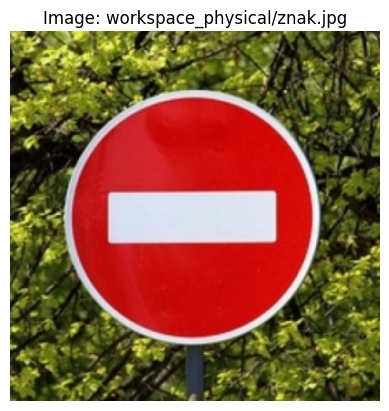

In [9]:
# Пример использования
model_path = 'model/cnn_rtsd_final.pt'
image_path = "workspace_physical/znak.jpg"  # Замени на путь к файлу изображения

predicted_class, confidence = check_photo(model_path, image_path)

if predicted_class is not None:
    print(f"Predicted class: {predicted_class}")
    print(f"Confidence: {confidence:.4f}")
else:
    print("Error processing image.")

try:
    img = Image.open(image_path)
    plt.imshow(img)
    plt.title(f"Image: {image_path}")
    plt.axis('off') # Turn off axes numbers
    plt.show()
except FileNotFoundError:
    print(f"Error: Image not found at {image_path}")
except Exception as e:
    print(f"Error displaying image: {e}")

(128, 128)


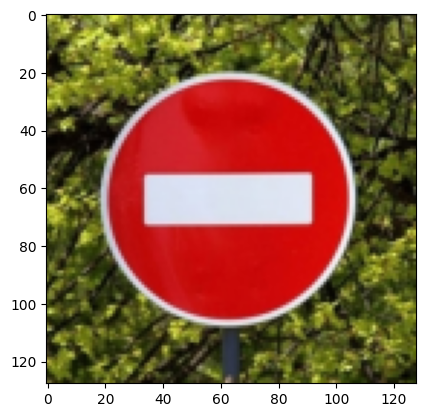

In [11]:
"""
0.4 Read in victim image and corresponding classification 
"""
###
RESIZED_SHAPE=(128,128) # influence the resolution of light generator and ZOO optimizer
###
test_img_ = cv2.imread("workspace_physical/znak.jpg")
test_img = cv2.resize(test_img_, RESIZED_SHAPE, interpolation=cv2.INTER_AREA)
test_img=test_img.astype(np.float32)/255
###
print(test_img[:, :, 0].shape)
plt.imshow(test_img[:, :, ::-1])

Модель успешно загружена!
Predict: 31 Confidence: 100.00%
Top 1 (100.00%) = 31 ...
Top 2 (0.00%) = 0 ...
Top 3 (0.00%) = 102 ...
Top 4 (0.00%) = 58 ...
Top 5 (0.00%) = 12 ...
Top 6 (0.00%) = 54 ...
Top 7 (0.00%) = 103 ...
Top 8 (0.00%) = 24 ...


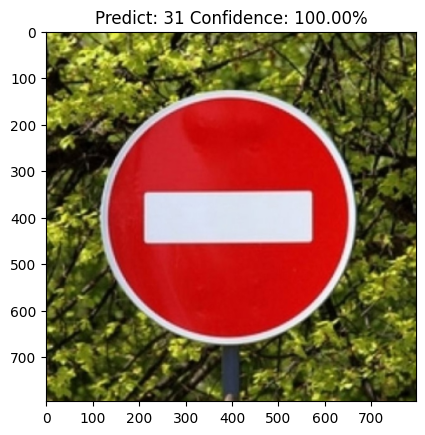

In [12]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1'  # Отключаем видимость GPU для PyTorch
import torch
import torchvision.transforms as transforms
from PIL import Image  # Используем PIL для единообразия
import matplotlib.pyplot as plt
import numpy as np

#  Определяем device (CPU или GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# (Предполагаем, что classifier, CLASSIFIER_INPUT_SHAPE, LABELS определены)

# Загрузка модели (УБЕДИТЕСЬ, что модель загружается на CPU, если CUDA недоступна)
try:
    if torch.cuda.is_available():
        classifier.load_state_dict(torch.load('model/cnn_rtsd_final.pt'))
    else:
        classifier.load_state_dict(torch.load('model/cnn_rtsd_final.pt', map_location=torch.device('cpu')))
    print("Модель успешно загружена!")
except FileNotFoundError:
    print("Файл cnn_rtsd_final.pt не найден. Проверьте путь к файлу.")
except RuntimeError as e:
    print(f"Ошибка при загрузке state_dict: {e}")
    print("Убедитесь, что архитектура модели соответствует архитектуре, для которой были сохранены веса.")

# Переносим модель на выбранное устройство
classifier.to(device)
# Переводим модель в режим eval
classifier.eval()

# Определяем преобразования (ИСПОЛЬЗУЕМ ТО ЖЕ, ЧТО И В РАБОЧЕМ КОДЕ!)
transform = transforms.Compose([
    transforms.Resize(CLASSIFIER_INPUT_SHAPE),  #  Размер
    transforms.ToTensor()  # Преобразуем в тензор
    #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # Ваша нормализация (ЕСЛИ ИСПОЛЬЗОВАЛАСЬ)
])

try:
    # Загружаем изображение с использованием PIL (КАК В РАБОЧЕМ КОДЕ!)
    image_path = "workspace_physical/znak.jpg" # Замените на свой путь
    img = Image.open(image_path).convert('RGB')

    # Преобразуем изображение
    tensor_img = transform(img).to(device)
    tensor_img = tensor_img.unsqueeze(0) # Добавляем batch dimension

    # Отключаем вычисление градиентов
    with torch.no_grad():
        # Получаем предсказания модели
        predict = torch.softmax(classifier(tensor_img).squeeze(), dim=-1)

        # Получаем индекс класса с наибольшей вероятностью и уверенность
        index = torch.argmax(predict).item()
        confidence = predict[index].item()

        # Записываем GROUND TRUTH (исправлено)
        GROUND_TRUTH = torch.tensor([index]).to(device)  # Переносим на то же устройство

        # Выводим результаты
        print(f"Predict: {LABELS[index]} Confidence: {confidence * 100:.2f}%")

        # Отображаем изображение (исправлено)
        plt.imshow(img)  #  Отображаем PIL изображение
        plt.title(f"Predict: {LABELS[index]} Confidence: {confidence * 100:.2f}%")

        # Выводим топ-8 предсказаний
        probs, indices = torch.topk(predict, k=8)
        probs = probs.tolist()
        indices = indices.tolist()

        for i, (indice, p) in enumerate(zip(indices, probs), 1):
            label = LABELS[indice]
            print(f"Top {i} ({p * 100:.2f}%) = {label[:25]} ...")

        # Отображаем график
        plt.show()

except Exception as e:
    print(f"Произошла ошибка: {e}")

# 1.Mask Drawer

In [13]:
"""
1.1 reading target video with lights on victim object
"""
###
SHAPE_RESIZED=(128,128) # influence the resolution of generator and ZOO optimizer
PATH_source="workspace_physical/source.png"
###
source_img = cv2.imread(PATH_source)
source_img = cv2.resize(source_img, SHAPE_RESIZED, interpolation=cv2.INTER_CUBIC)
test_img = source_img.astype(np.float32)/255.0

In [14]:
"""
1.2 record all training target: target_0.mov, target_1.mov ....
"""
import re
target_nums=0
for filename in os.listdir("workspace_physical"):
    pattern_num=re.compile("target_")
    find = re.search(pattern_num, filename)
    if find !=None:
        target_nums+=1
    
print(target_nums)

2


(591, 128, 128, 4)
(591, 128, 128, 3)
(567, 128, 128, 4)
(567, 128, 128, 3)


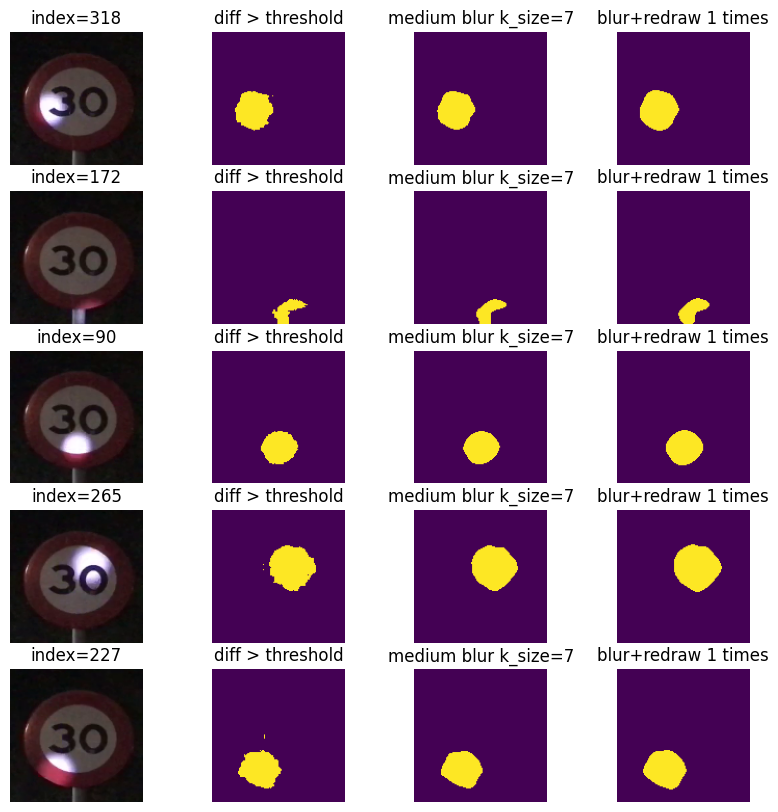

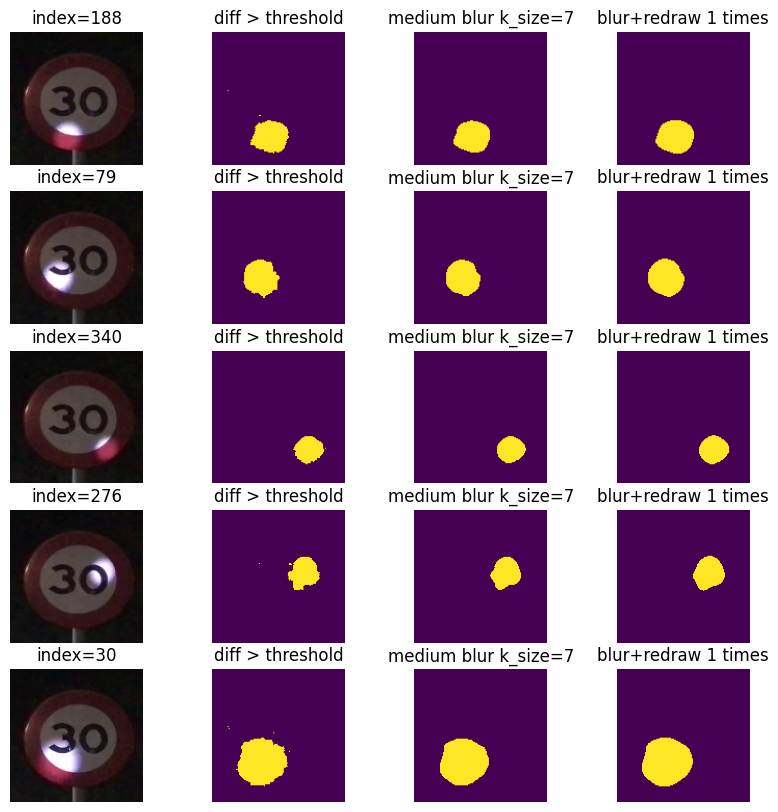

In [14]:
from mask import mask_extract,mask_save,mask_demo
mask_extract(source_img, target_nums, if_rotate,x_bound, y_bound)

In [15]:
"""
1.5 If you satisfy the mask result then concate all existing sub-data you want to train together
"""
mask_save()

Total target(Train) shape= (1158, 128, 128, 3)
Total target( Val ) shape= (127, 128, 128, 3)


# 2. Object-Dependent Light Generator

In [15]:
"""
2.1 Initialize Light Generator 
"""
from model import Generator
###
GENERATOR_MODEL=Generator
GENERATOR_INIT="model/pre_light_generator.pt" # From pre-train stage
###
print("CUDA Available: ", torch.cuda.is_available())
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:",device)

light_generator = GENERATOR_MODEL(gen_input_nc=4, image_nc=3).to(device) # 4 = static+mask
if (GENERATOR_INIT):
     light_generator.load_state_dict(torch.load(GENERATOR_INIT, map_location=torch.device('cpu'))["model_state_dict"])
    

CUDA Available:  False
Device: cpu


In [16]:
"""
2.2 Dataset for training Light Generator 
"""
from light_generator import GAN_dataset
###
PATH_traindata="dataset/physical/train_data.npy"
PATH_traintarget="dataset/physical/train_target.npy"
PATH_valdata="dataset/physical/val_data.npy"
PATH_valtarget="dataset/physical/val_target.npy"
batch_size=16
###
load_augmentation=torchvision.transforms.Compose([torchvision.transforms.ToTensor(),
               #torchvision.transforms.RandomRotation(degrees=(-30,30))
                                                 ])   
load_transform = torchvision.transforms.ToTensor()

train_dataset = GAN_dataset(PATH_traindata,PATH_traintarget,load_augmentation)
train_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size,shuffle=True)
val_dataset =  GAN_dataset(PATH_valdata,PATH_valtarget,load_transform)
val_loader = torch.utils.data.DataLoader(val_dataset,batch_size=batch_size,shuffle=True)

In [17]:
"""
2.3 Learning Module of Light Generator
"""
G_criterion = nn.MSELoss()

lr_G = 0.0002
beta1 = 0.5 # Beta1 hyperparam for Adam optimizers

optimizerG = optim.Adam(light_generator.parameters(), lr = lr_G, betas=(beta1, 0.999))
schedulerG = torch.optim.lr_scheduler.StepLR(optimizerG, 100, gamma=0.5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0047940984..1.0752509].


epoch = 0, G_loss_MSE = 0.00104


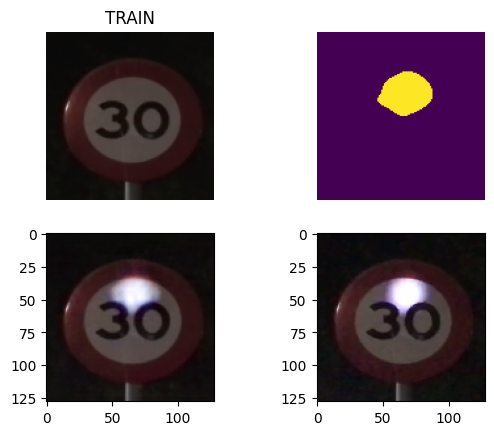

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.020092705..1.084361].


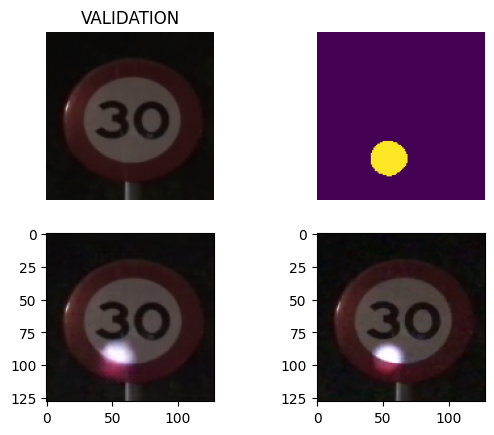

#Validation, G_loss = 0.00119#


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026011761..1.1117313].


epoch = 5, G_loss_MSE = 0.00052


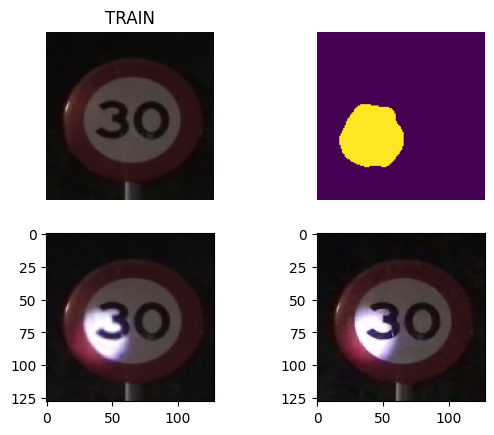

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.014676992..1.114645].


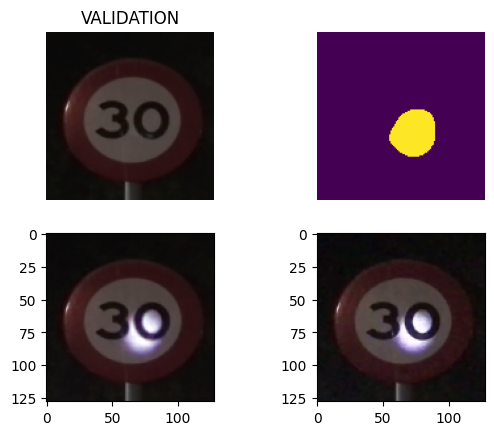

#Validation, G_loss = 0.00050#
epoch = 10, G_loss_MSE = 0.00041


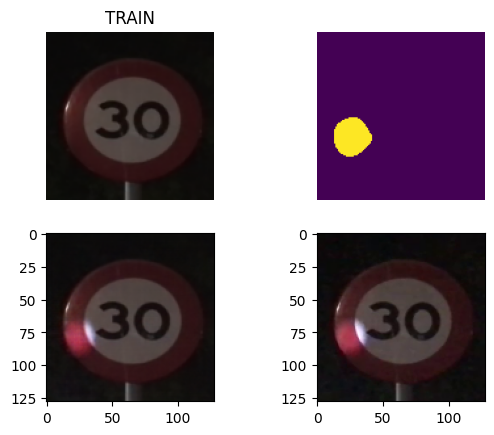

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013268767..0.9285532].


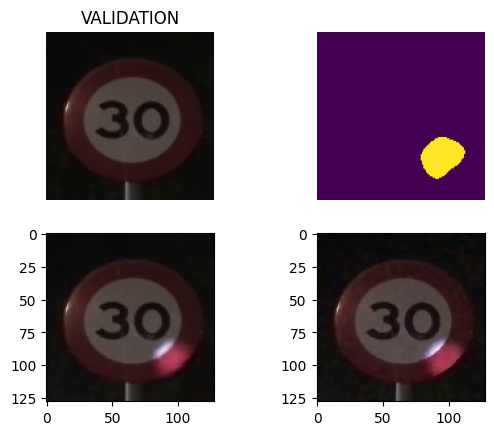

#Validation, G_loss = 0.00043#


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026585523..1.1169072].


epoch = 15, G_loss_MSE = 0.00038


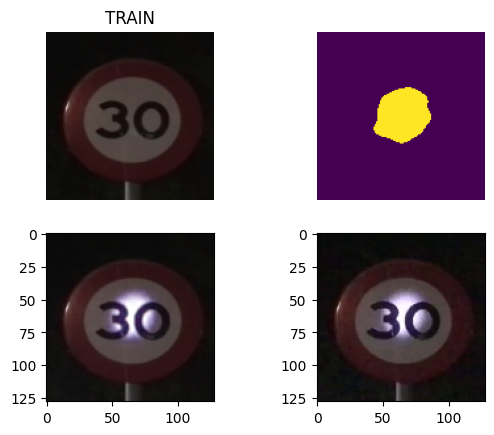

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [4.4098124e-06..1.1021096].


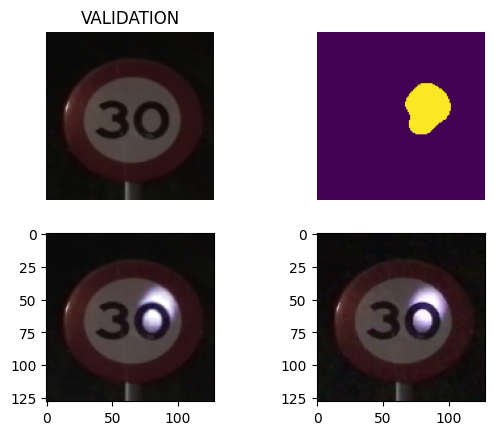

#Validation, G_loss = 0.00040#


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.019961786..1.0916986].


epoch = 20, G_loss_MSE = 0.00039


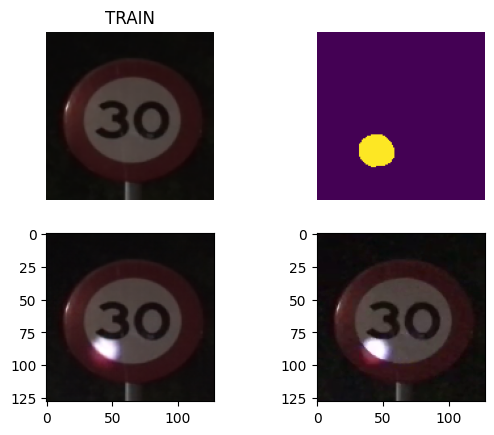

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.021829478..1.07999].


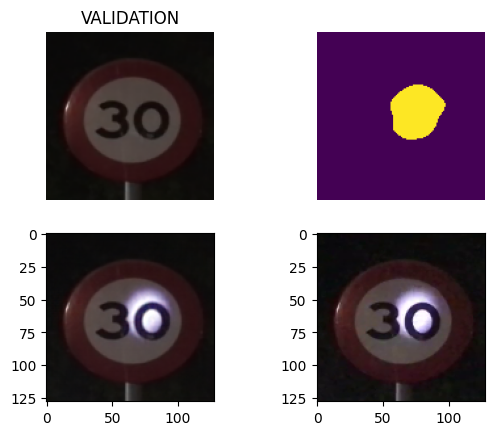

#Validation, G_loss = 0.00037#


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0046078265..1.0813562].


epoch = 25, G_loss_MSE = 0.00038


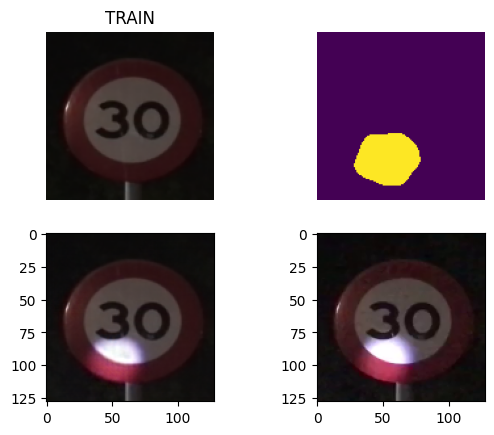

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.021837085..1.139713].


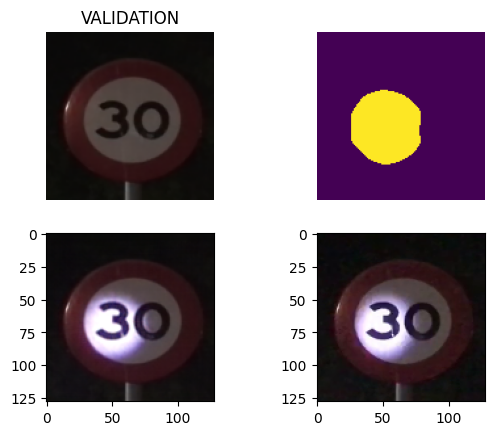

#Validation, G_loss = 0.00046#


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0106233..1.1132921].


epoch = 30, G_loss_MSE = 0.00029


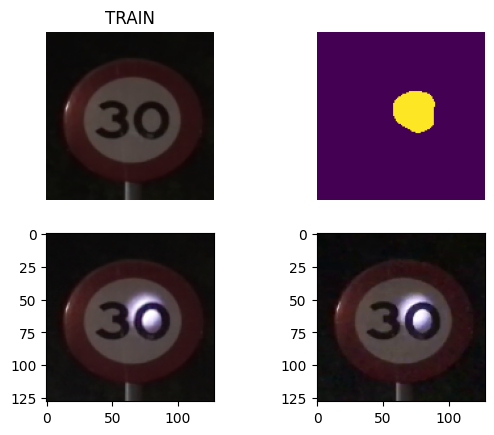

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0036717616..1.026869].


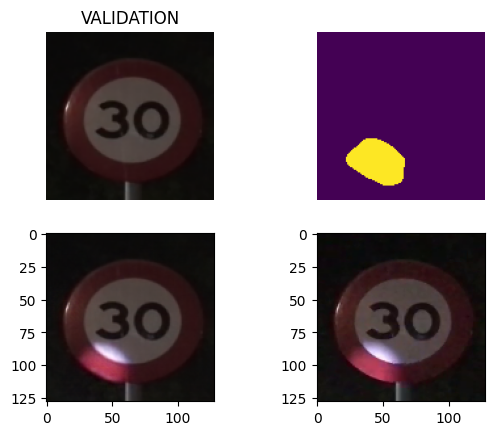

#Validation, G_loss = 0.00037#


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0075891074..1.0464035].


epoch = 35, G_loss_MSE = 0.00030


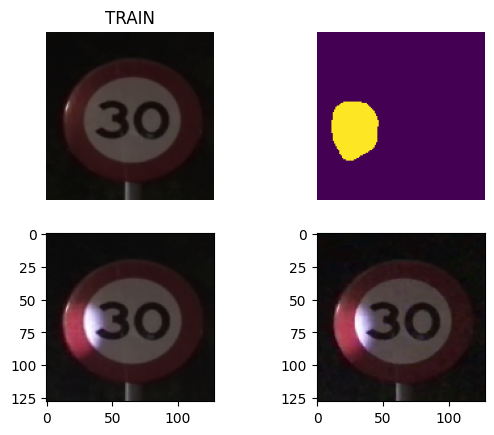

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.024414556..1.0701967].


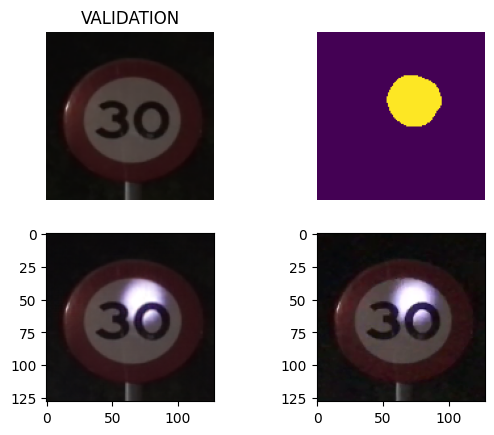

#Validation, G_loss = 0.00032#


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [8.416921e-05..1.0864637].


epoch = 40, G_loss_MSE = 0.00026


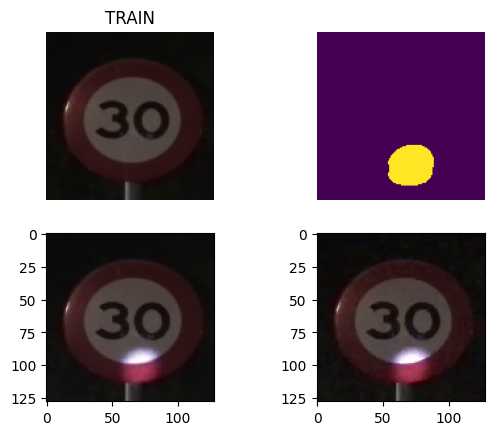

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0035173912..1.0611107].


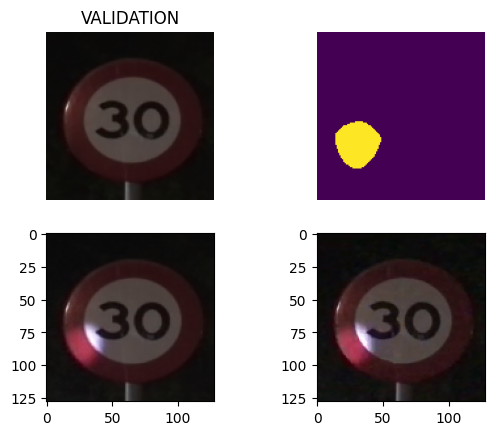

#Validation, G_loss = 0.00032#


In [19]:
from light_generator import train

train(light_generator,optimizerG,schedulerG,G_criterion,train_loader,val_loader,num_epochs=41,Freq_print=5,Freq_plot=5)

In [18]:
"""
ПОПЫТКА ДВА 0.4 Read in victim image and corresponding classification 
"""
"""
1.1 reading target video with lights on victim object
"""
###
SHAPE_RESIZED=(128,128) # influence the resolution of generator and ZOO optimizer
PATH_source="workspace_physical/znak.jpg"
###
source_img = cv2.imread(PATH_source)
source_img = cv2.resize(source_img, SHAPE_RESIZED, interpolation=cv2.INTER_CUBIC)
test_img = source_img.astype(np.float32)/255.0

[64, 50, 15]


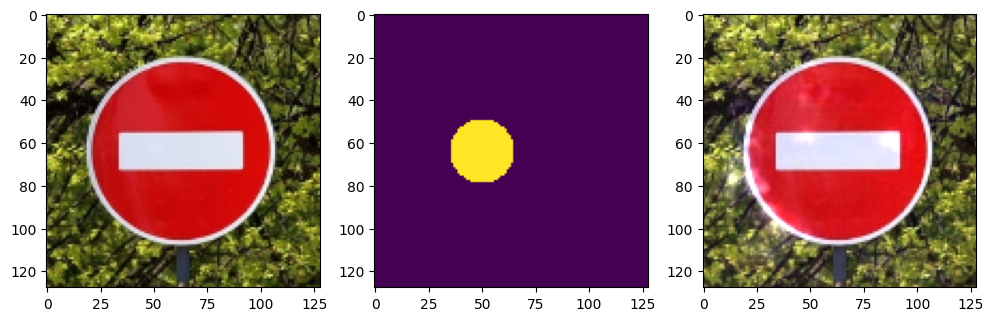

In [19]:
"""
2.5 Demo Light Generator with Random mask
"""
from light_generator import simulate_light_circle,simulate_light_elipse,simulate_light_polygon
###
min_list=[40,40,10] # (x,y,r)
max_list=[80,80,25]
mask_pos=[np.random.randint(min_list[i], max_list[i]) for i in range(len(min_list))]
print(mask_pos)
###



light_generator=GENERATOR_MODEL(gen_input_nc=4, image_nc=3).to(device)
light_generator.load_state_dict(torch.load("model/light_generator.pt", map_location=torch.device('cpu'))["model_state_dict"])
sim,mask=simulate_light_circle(light_generator, source_img, mask_pos)

plt.figure(figsize=(12,12))
plt.subplot(1,3,1)
plt.imshow(source_img[:,:,::-1])

plt.subplot(1,3,2)
plt.imshow(mask)

plt.subplot(1,3,3)
plt.imshow(sim[:,:,::-1])

In [20]:
print(source_img)

[[[ 96 187 180]
  [ 94 204 197]
  [ 59 186 178]
  ...
  [ 24  56  55]
  [ 12  43  42]
  [  7  42  38]]

 [[ 63 160 154]
  [122 232 228]
  [ 53 184 177]
  ...
  [126 171 168]
  [ 54  86  85]
  [ 49  80  80]]

 [[ 49 140 133]
  [ 70 177 173]
  [ 52 168 163]
  ...
  [ 71 122 122]
  [129 167 169]
  [ 27  63  66]]

 ...

 [[ 12  41  38]
  [  6  39  35]
  [  0  40  34]
  ...
  [  0  11   9]
  [ 13  33  28]
  [  6  28  23]]

 [[ 29  68  69]
  [ 24  53  57]
  [ 20  54  54]
  ...
  [  2  27  19]
  [  5  34  25]
  [ 10  39  30]]

 [[ 50 103 104]
  [ 63 110 114]
  [  5  44  48]
  ...
  [ 16  64  56]
  [ 16  63  54]
  [ 13  53  42]]]


# 3.ZOO attack optimizer

In [21]:
from optimize import ZeroOrderOptimizer

###
test_img
criteria = nn.CrossEntropyLoss()
label_attack = GROUND_TRUTH[0]

#############################################################
pos_min_list=[0.3*RESIZED_SHAPE[0], 0.3*RESIZED_SHAPE[1],30] # specify lower bound of each dimension (x1,y1,x2,y2,x3,y3)
pos_max_list=[0.7*RESIZED_SHAPE[0], 0.7*RESIZED_SHAPE[1],10] # specify upper bound of each dimension
###
ZOO_optimizer = ZeroOrderOptimizer(
    source_img, # victim image
    iter=6, # optimize iter of each start point
    label=GROUND_TRUTH.squeeze(),
    attack_model=classifier,
    light_generator=light_generator,
    criteria=criteria, # score criteria
    point_num=5, # number of start point
    draw_light=simulate_light_circle, # draw mask from pos-space to x,y plabe
    min_list=pos_min_list, # lower bound of pos-space
    max_list=pos_max_list, # upper bound of pos-space
    classifier_input_shape=CLASSIFIER_INPUT_SHAPE,
    LABELS=LABELS,
    grad_step=1, # step size to approximate grad(smoothing parameter in ZOO term)
    lr_step=3, # optimize step based on grad
    threshold_restart=0.001 # converge restart threshold
)

Представь, что ты хочешь обмануть учителя, чтобы он не узнал тебя на фотографии. Но ты не можешь замазать лицо или надеть маску. Ты можешь только немного изменить освещение на фотографии.

**Задача:** Найти, где и какого размера поставить "фонарик" на картинке, чтобы нейросеть (наш "учитель") перестала узнавать на ней нужный объект.

**Как это делается:**

1. **"Кандидаты" (Point):** У нас есть несколько "хулиганов" (Point), каждый из которых пытается по-своему обмануть нейросеть. Каждый "хулиган" выбирает случайное место и размер для своего "фонарика".

2. **"Фонарик" (simulate_light_circle):** Каждый "хулиган" берёт картинку и с помощью специальной функции (simulate_light_circle) рисует на ней круг света (наш "фонарик") в выбранном месте и заданного размера.

3. **"Обман" (light_inference):** Теперь нужно проверить, получилось ли обмануть нейросеть. Мы показываем нейросети картинку с "фонариком" и смотрим, что она скажет.

   * Если нейросеть ошиблась (не узнала объект), значит "хулиган" был близок к цели!
   * Если нейросеть всё ещё узнаёт объект, значит "фонарик" нужно подвинуть или изменить его размер.

4. **"Подсказки" (find_grad):** Чтобы понять, куда двигать "фонарик", каждый "хулиган" делает небольшие пробные шаги:

   * Чуть-чуть двигает "фонарик" вправо и смотрит, стало лучше или хуже обманывать нейросеть.
   * Чуть-чуть двигает "фонарик" влево и смотрит, стало лучше или хуже.
   * И так далее для движения вверх, вниз, и изменения размера "фонарика".

   Сравнивая результаты, "хулиган" понимает, в какую сторону нужно двигать "фонарик", чтобы обмануть нейросеть. Это похоже на то, как ты ищешь выход из лабиринта, пробуя разные пути.

5. **"Движение" (update_pos):** "Хулиган" делает небольшой шаг в направлении, которое, по его мнению, поможет обмануть нейросеть. Он двигает "фонарик" и немного меняет его размер.

6. **Повторение (run):** Шаги 2-5 повторяются много раз. Каждый "хулиган" пробует разные места и размеры для своего "фонарика", пока один из них не сможет успешно обмануть нейросеть.

7. **"Усталость" (threshold_restart):** Иногда "хулиган" застревает в плохом месте, где никак не получается обмануть нейросеть. Тогда он решает начать всё сначала и выбирает новое случайное место для своего "фонарика".

**Главная идея:**

*   Мы не знаем, как именно работает нейросеть и какие места на картинке для неё самые важные.
*   Поэтому мы пробуем разные варианты "фонариков" и смотрим, какие из них заставляют нейросеть ошибаться.
*   Мы используем небольшие пробные шаги, чтобы понять, в какую сторону нужно двигать "фонарик", чтобы увеличить вероятность обмана.

В итоге, с помощью проб и ошибок, мы находим такое положение и размер "фонарика", которое сбивает нейросеть с толку и заставляет её ошибаться. И всё это без знания внутренней работы нейросети!


In [22]:
ZOO_optimizer.run()

58
Confidence: 31.822919845581055 %
best pos [np.int16(52), np.int16(88), np.int16(10)]
Largest Loss 2.953049659729004


True

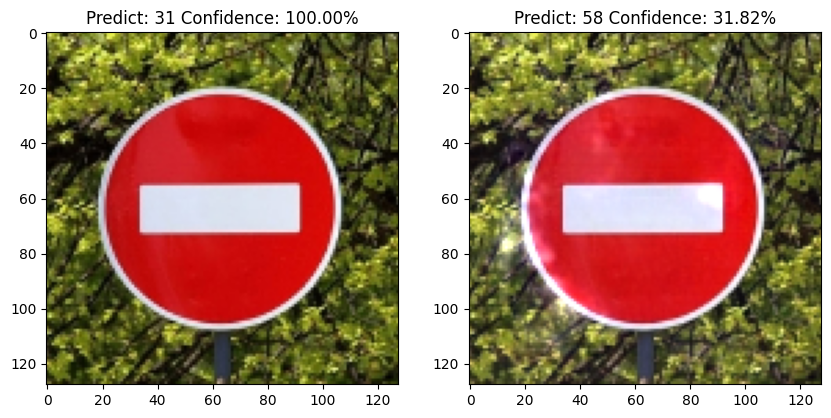

In [23]:
"""
3.5 Demo of ZOO optimize result 
"""
print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

plt.subplot(122)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[ZOO_optimizer.predict], ZOO_optimizer.confidence.item()*100))
plt.imshow(ZOO_optimizer.attack_img[:,:,::-1])

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))

58
Confidence: 31.822919845581055 %
best pos [np.int16(52), np.int16(88), np.int16(10)]
Largest Loss 2.953049659729004


True

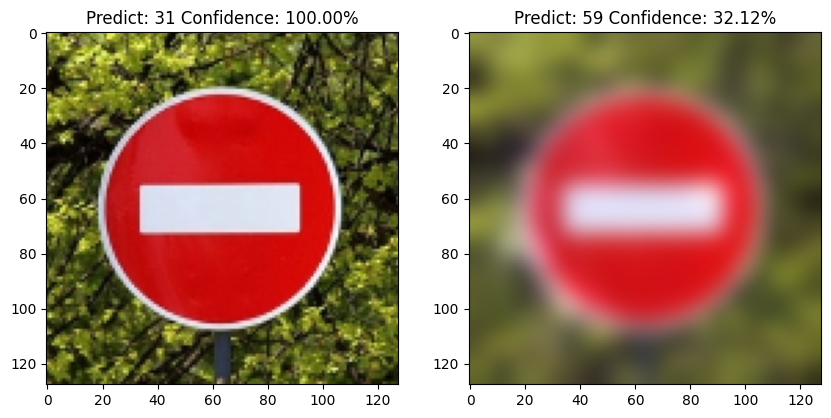

In [24]:
"""
3.5 Demo of ZOO optimize result + ГАУСС
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
from PIL import Image, ImageFilter

print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

# Apply Gaussian blur to the attacked image
blurred_attack_img = cv2.GaussianBlur(ZOO_optimizer.attack_img, (25, 25), 0) # kernel size 5x5, sigma=0
"""
kernel = np.array([[-1, -1, -1],
                   [-1, 9, -1],
                   [-1, -1, -1]])

blurred_attack_img = cv2.filter2D(blurred_attack_img, -1, kernel)
"""

# Re-evaluate with the blurred image
classifier.eval()
resize_img = cv2.resize(blurred_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)

predict_blurred = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_blurred = torch.argmax(predict_blurred).item()
confidence_blurred = predict_blurred[index_blurred].item()

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

plt.subplot(122)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index_blurred], confidence_blurred*100))
plt.imshow(blurred_attack_img[:,:,::-1])

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/blurred_sim_light.png', (blurred_attack_img*255).clip(0,255).astype("uint8")[:,:,::-1])

58
Confidence: 31.822919845581055 %
best pos [np.int16(52), np.int16(88), np.int16(10)]
Largest Loss 2.953049659729004


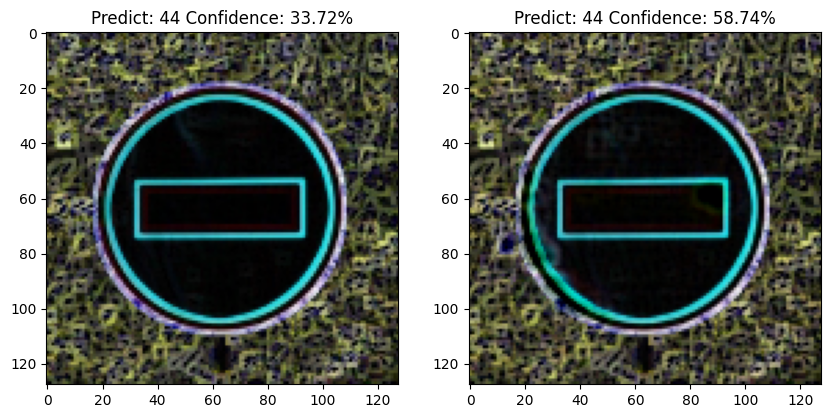

In [51]:
"""
3.5 Demo of ZOO optimize result + Dilation Subtraction (Improved)
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

def dilation_subtraction(image, kernel_size=(5, 5)):
    """Applies dilation to the image and subtracts the dilated image from the original.

    Args:
        image (numpy.ndarray): Input image.
        kernel_size (tuple): Size of the kernel for dilation.

    Returns:
        numpy.ndarray: Resulting image after dilation and subtraction.
    """
    kernel = np.ones(kernel_size, np.uint8)
    dilated_img = cv2.dilate(image, kernel, iterations=1)

    # Use absolute difference
    subtracted_img = cv2.absdiff(image, dilated_img)

    # Scale the image to the range 0-1
    subtracted_img = subtracted_img.astype(np.float32) / 255.0

    return subtracted_img

# Apply dilation subtraction to both images
dilated_subtracted_attack_img = dilation_subtraction(ZOO_optimizer.attack_img*255.0) # Scale to 0-255 before dilation
dilated_subtracted_test_img = dilation_subtraction(test_img*255.0)

# Re-evaluate with the processed attacked image
classifier.eval()
resize_img = cv2.resize(dilated_subtracted_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)

predict_dilated = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_dilated = torch.argmax(predict_dilated).item()
confidence_dilated = predict_dilated[index_dilated].item()

# Re-evaluate with the processed test image
resize_img_test = cv2.resize(dilated_subtracted_test_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img_test = torchvision.transforms.ToTensor()(resize_img_test).unsqueeze(0).to(device)

predict_test = torch.softmax(classifier.forward(tensor_img_test).squeeze(), dim=-1)

index_test = torch.argmax(predict_test).item()
confidence_test = predict_test[index_test].item()

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index_test],confidence_test*100))
plt.imshow(dilated_subtracted_test_img[:,:,::-1])

plt.subplot(122)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index_dilated], confidence_dilated*100))
plt.imshow(dilated_subtracted_attack_img[:,:,::-1])

58
Confidence: 31.822919845581055 %
best pos [np.int16(52), np.int16(88), np.int16(10)]
Largest Loss 2.953049659729004


True

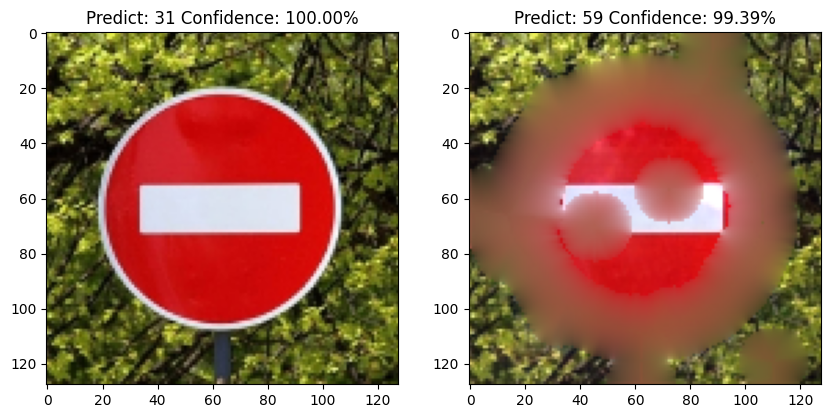

In [26]:
"""
3.5 Demo of ZOO optimize result + Inpainting
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

def inpaint_image(img):
    """Applies inpainting to the image based on color thresholding and morphological operations.

    Args:
        img (numpy.ndarray): Input image.

    Returns:
        numpy.ndarray: Inpainted image.
    """
    hh, ww = img.shape[:2]

    # threshold
    lower = (150,150,150)
    upper = (240,240,240)
    thresh = cv2.inRange(img, lower, upper)

    # apply morphology close and open to make mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
    morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (25,25))
    morph = cv2.morphologyEx(morph, cv2.MORPH_DILATE, kernel, iterations=1)

    # floodfill the outside with black
    black = np.zeros([hh + 2, ww + 2], np.uint8)
    mask = morph.copy()
    mask = cv2.floodFill(mask, black, (0,0), 0, 0, 0, flags=8)[1]

    # use mask with input to do inpainting (TELEA algorithm)
    result = cv2.inpaint(img, mask, 101, cv2.INPAINT_TELEA)

    return result

# Apply inpainting to the attacked image
inpainted_attack_img = inpaint_image((ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8")) / 255.0
inpainted_attack_img = inpainted_attack_img.astype(np.float32) # Convert to float32


# Re-evaluate with the inpainted image
classifier.eval()
resize_img = cv2.resize(inpainted_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device).float() #Convert to float32

predict_inpainted = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_inpainted = torch.argmax(predict_inpainted).item()
confidence_inpainted = predict_inpainted[index_inpainted].item()

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

plt.subplot(122)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index_inpainted], confidence_inpainted*100))
plt.imshow(inpainted_attack_img[:,:,::-1])

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/inpainted_sim_light.png', (inpainted_attack_img*255).clip(0,255).astype("uint8")[:,:,::-1])

58
Confidence: 31.822919845581055 %
best pos [np.int16(52), np.int16(88), np.int16(10)]
Largest Loss 2.953049659729004


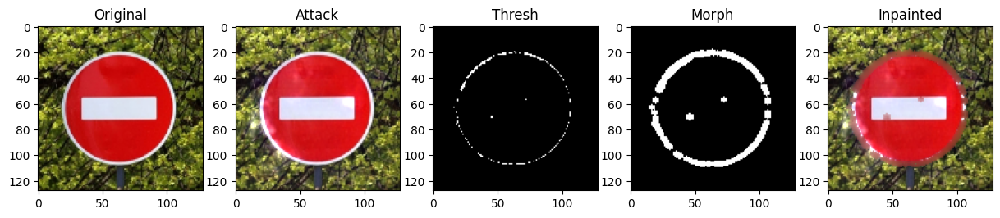

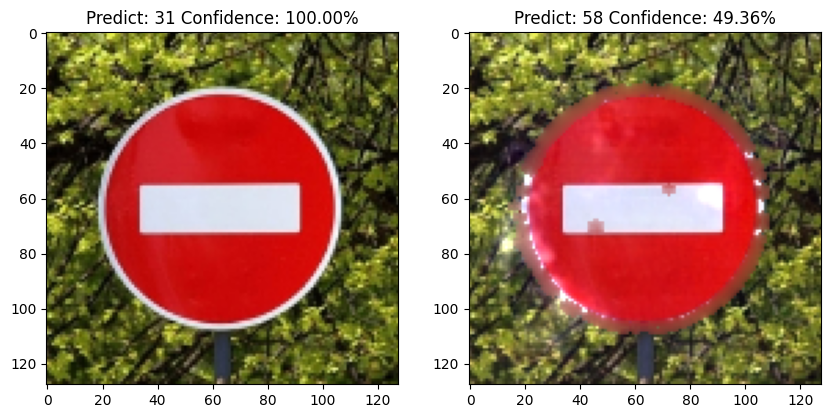

In [35]:
"""
3.5 Demo of ZOO optimize result + Inpainting + Intermediate Image Output
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

def inpaint_image(img):
    """Applies inpainting to the image based on color thresholding and morphological operations.

    Args:
        img (numpy.ndarray): Input image.

    Returns:
        tuple: (Inpainted image, thresholded image, morphologically processed image, mask)
    """
    hh, ww = img.shape[:2]

    # threshold
    lower = (170,170,170)
    upper = (240,240,240)
    thresh = cv2.inRange(img, lower, upper)

    # apply morphology close and open to make mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7,7))
    morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    morph = cv2.morphologyEx(morph, cv2.MORPH_DILATE, kernel, iterations=1)

    # floodfill the outside with black
    black = np.zeros([hh + 2, ww + 2], np.uint8)
    mask = morph.copy()
    mask = cv2.floodFill(mask, black, (0,0), 0, 0, 0, flags=8)[1]

    # use mask with input to do inpainting (TELEA algorithm)
    result = cv2.inpaint(img, mask, 101, cv2.INPAINT_TELEA)

    return result, thresh, morph, mask


# Apply inpainting to the attacked image
attack_img_uint8 = (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8")
inpainted_attack_img, thresh, morph, mask = inpaint_image(attack_img_uint8)
inpainted_attack_img = inpainted_attack_img.astype(np.float32) / 255.0


# Re-evaluate with the inpainted image
classifier.eval()
resize_img = cv2.resize(inpainted_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device).float() #Convert to float32

predict_inpainted = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_inpainted = torch.argmax(predict_inpainted).item()
confidence_inpainted = predict_inpainted[index_inpainted].item()

plt.figure(figsize=(15,5))

plt.subplot(151)
plt.title("Original")
plt.imshow(test_img[:,:,::-1])

plt.subplot(152)
plt.title("Attack")
plt.imshow(attack_img_uint8[:,:,::-1])

plt.subplot(153)
plt.title("Thresh")
plt.imshow(thresh, cmap='gray')

plt.subplot(154)
plt.title("Morph")
plt.imshow(morph, cmap='gray')

plt.subplot(155)
plt.title("Inpainted")
plt.imshow(inpainted_attack_img[:,:,::-1])


# Re-evaluate with the inpainted image
classifier.eval()
resize_img = cv2.resize(inpainted_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device).float() #Convert to float32

predict_inpainted = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_inpainted = torch.argmax(predict_inpainted).item()
confidence_inpainted = predict_inpainted[index_inpainted].item()

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

plt.subplot(122)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index_inpainted], confidence_inpainted*100))
plt.imshow(inpainted_attack_img[:,:,::-1])


58
Confidence: 31.822919845581055 %
best pos [np.int16(52), np.int16(88), np.int16(10)]
Largest Loss 2.953049659729004


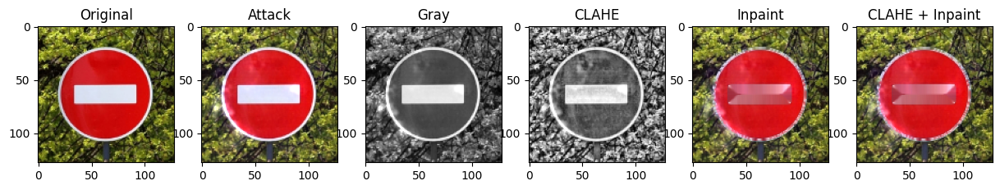

In [49]:
"""
3.5 Demo of ZOO optimize result + Glare Removal Techniques (Simplified)
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

def glare_removal(img):
    """Applies various techniques to remove glare from the image.

    Args:
        img (numpy.ndarray): Input image.

    Returns:
        tuple: (Original image, Grayscale image, CLAHE corrected BGR image,
               Inpainted image, CLAHE+Inpainted image)
    """

    # convert to gray
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    grayimg = gray

    # Inpaint (using grayscale mask)
    mask1 = cv2.threshold(grayimg, 220, 255, cv2.THRESH_BINARY)[1]
    result1 = cv2.inpaint(img, mask1, 0.1, cv2.INPAINT_TELEA)

    # CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahefilter = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(16, 16))
    claheCorrecttedFrame = clahefilter.apply(grayimg)

    # Inpaint + CLAHE (using CLAHE'd image as input)
    clahe_bgr = img.copy()  # Use img.copy() to create a copy
    grayimg1 = cv2.cvtColor(clahe_bgr, cv2.COLOR_BGR2GRAY)
    mask2 = cv2.threshold(grayimg1, 220, 255, cv2.THRESH_BINARY)[1]
    result2 = cv2.inpaint(img, mask2, 0.1, cv2.INPAINT_TELEA)

    return img, gray, claheCorrecttedFrame, result1, result2


# Apply glare removal to the attacked image
attack_img_uint8 = (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8")
(img, gray, claheCorrecttedFrame, result1, result2) = glare_removal(attack_img_uint8)

# Re-evaluate with the preprocessed attacked image(result2)
classifier.eval()
resize_img = cv2.resize(result2, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device).float()

predict_glare = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_glare = torch.argmax(predict_glare).item()
confidence_glare = predict_glare[index_glare].item()

plt.figure(figsize=(15,5))

plt.subplot(1, 6, 1)
plt.title("Original")
plt.imshow(test_img[:,:,::-1])

plt.subplot(1, 6, 2)
plt.title("Attack")
plt.imshow(attack_img_uint8[:,:,::-1])

plt.subplot(1, 6, 3)
plt.title("Gray")
plt.imshow(gray, cmap='gray')

plt.subplot(1, 6, 4)
plt.title("CLAHE")
plt.imshow(claheCorrecttedFrame, cmap='gray')

plt.subplot(1, 6, 5)
plt.title("Inpaint")
plt.imshow(result1[:,:,::-1])

plt.subplot(1, 6, 6)
plt.title("CLAHE + Inpaint")
plt.imshow(result2[:,:,::-1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011969772..1.1006469].


58
Confidence: 31.199362874031067 %
best pos [np.int16(59), np.int16(86), np.int16(10)]
Largest Loss 2.9364218711853027


True

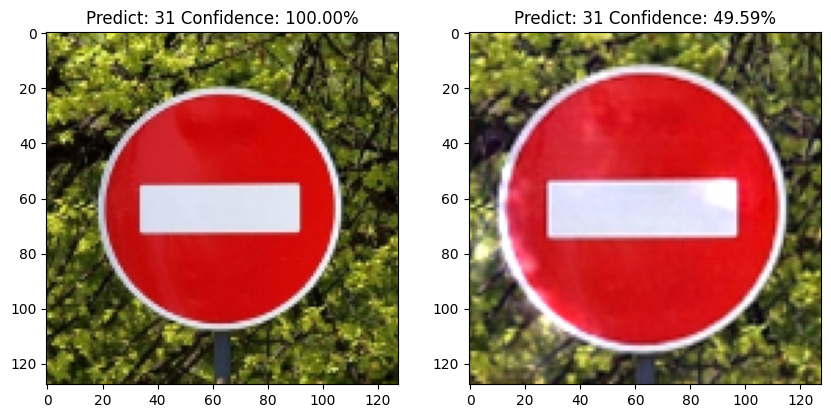

In [91]:
"""
3.5 Demo of ZOO optimize result + Crop + Resize
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

def crop_and_resize(image, crop_size=10, target_size=(128, 128)):
    """Crops the image by crop_size pixels from each side and then resizes to target_size.

    Args:
        image (numpy.ndarray): Input image.
        crop_size (int): Number of pixels to crop from each side.
        target_size (tuple): Target size for resizing (width, height).

    Returns:
        numpy.ndarray: Cropped and resized image.
    """
    height, width, _ = image.shape
    cropped_img = image[crop_size:height - crop_size, crop_size:width - crop_size]
    resized_img = cv2.resize(cropped_img, target_size, interpolation=cv2.INTER_CUBIC)
    return resized_img


# Apply crop and resize to the attacked image
cropped_resized_attack_img = crop_and_resize(ZOO_optimizer.attack_img)


# Re-evaluate with the cropped and resized image
classifier.eval()
resize_img = cv2.resize(cropped_resized_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC) # resize to input size for classifier
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)

predict_cropped = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_cropped = torch.argmax(predict_cropped).item()
confidence_cropped = predict_cropped[index_cropped].item()

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

plt.subplot(122)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index_cropped], confidence_cropped*100))
plt.imshow(cropped_resized_attack_img[:,:,::-1])

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/cropped_resized_sim_light.png', (cropped_resized_attack_img*255).clip(0,255).astype("uint8")[:,:,::-1])

58
Confidence: 31.199362874031067 %
best pos [np.int16(59), np.int16(86), np.int16(10)]
Largest Loss 2.9364218711853027


True

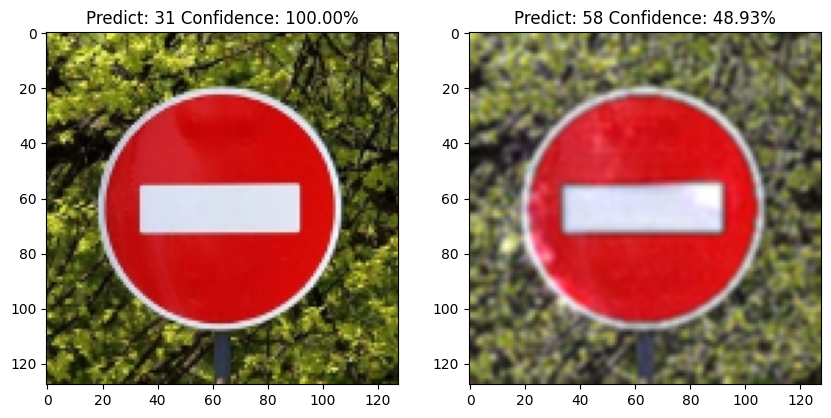

In [92]:
"""
3.5 Demo of ZOO optimize result + Медианный фильтр + Улучшение резкости (PIL ImageFilter.SHARPEN)
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
from PIL import Image, ImageFilter

print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

def sharpen_image(img):
    """Применяет фильтр повышения резкости к изображению (PIL).

    Args:
        img (numpy.ndarray): Исходное изображение (numpy array).

    Returns:
        numpy.ndarray: Изображение с повышенной резкостью (numpy array).
    """
    # Convert numpy array to PIL Image
    img_pil = Image.fromarray(cv2.cvtColor((img*255).clip(0,255).astype(np.uint8), cv2.COLOR_BGR2RGB))

    # Apply sharpening filter
    sharpened_img_pil = img_pil.filter(ImageFilter.SHARPEN)

    # Convert PIL Image back to numpy array
    sharpened_img = cv2.cvtColor(np.array(sharpened_img_pil), cv2.COLOR_RGB2BGR).astype(np.float32) / 255.0
    return sharpened_img

sharpened_attack_img = sharpen_image(ZOO_optimizer.attack_img)
sharpened_attack_img = sharpen_image(sharpened_attack_img)
sharpened_attack_img = sharpen_image(sharpened_attack_img)
sharpened_attack_img = cv2.GaussianBlur(sharpened_attack_img, (5, 5), 0)





# Re-evaluate with the sharpened image
classifier.eval()
resize_img = cv2.resize(sharpened_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)

predict_sharpened = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_sharpened = torch.argmax(predict_sharpened).item()
confidence_sharpened = predict_sharpened[index_sharpened].item()

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

plt.subplot(122)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index_sharpened], confidence_sharpened*100))
plt.imshow(sharpened_attack_img[:,:,::-1])

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/median_sharpened_sim_light.png', (sharpened_attack_img*255).clip(0,255).astype("uint8")[:,:,::-1])

Min/Max values after CLAHE: 3, 255
Min/Max normalized values: 0.011764705882352941, 1.0
Min/Max values after color transformation: 0, 255


True

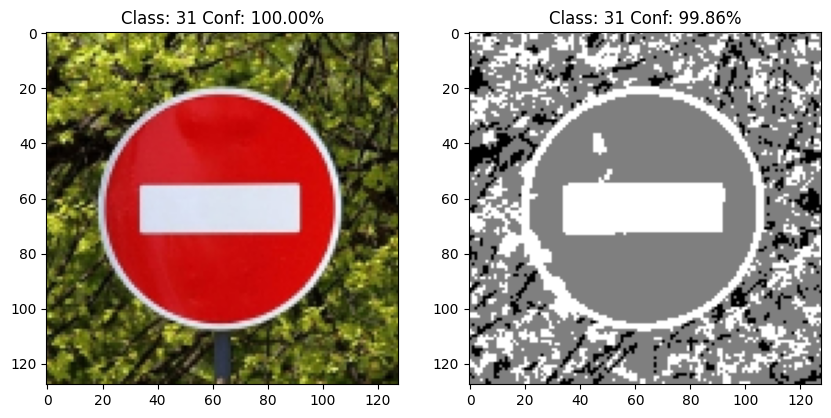

In [93]:
"""
3.5 Demo of ZOO optimize result + Контраст и цветовая палитра (исправлено)
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

#print(LABELS[ZOO_optimizer.predict])
#print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
#print("best pos", ZOO_optimizer.global_best_pos)
#print("Largest Loss",ZOO_optimizer.global_best_value)

# 1. Convert to grayscale
gray_attack_img = cv2.cvtColor(ZOO_optimizer.attack_img, cv2.COLOR_BGR2GRAY)

# 2. Enhance contrast (using CLAHE - Contrast Limited Adaptive Histogram Equalization)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))  # Adjust parameters as needed

# Scale to 0-255 and convert to uint8 for CLAHE
gray_attack_img_scaled = (gray_attack_img * 255).clip(0, 255).astype(np.uint8)

contrast_enhanced_img = clahe.apply(gray_attack_img_scaled)

# Check the range of values after CLAHE
print(f"Min/Max values after CLAHE: {np.min(contrast_enhanced_img)}, {np.max(contrast_enhanced_img)}")

# 3. Change the color palette
# Create a 3-channel image
color_transformed_img = np.zeros((contrast_enhanced_img.shape[0], contrast_enhanced_img.shape[1], 3), dtype=np.uint8)

# Normalize values to 0-1 range (instead of 0-100)
normalized_img = contrast_enhanced_img / 255.0

# Check the range of normalized values
print(f"Min/Max normalized values: {np.min(normalized_img)}, {np.max(normalized_img)}")

# Apply the color transformation rules
color_transformed_img[normalized_img <= 0.15] = [0, 0, 0]  # Black for brightness 0-10%
color_transformed_img[(normalized_img > 0.15) & (normalized_img <= 0.65)] = [127, 127, 127]  # Gray for brightness 10-50%
color_transformed_img[normalized_img > 0.65] = [255, 255, 255]  # White for brightness 50-100%

# Check the range of values after color transformation
print(f"Min/Max values after color transformation: {np.min(color_transformed_img)}, {np.max(color_transformed_img)}")

# 4. Re-evaluate with the transformed image
classifier.eval()
resize_img = cv2.resize(color_transformed_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)

predict_transformed = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_transformed = torch.argmax(predict_transformed)
confidence_transformed = predict_transformed[index_transformed].item()

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

plt.subplot(122)
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_transformed], confidence_transformed*100))
plt.imshow(cv2.cvtColor(color_transformed_img, cv2.COLOR_BGR2RGB))  # Display as RGB

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/color_transformed_sim_light.png', color_transformed_img)

True

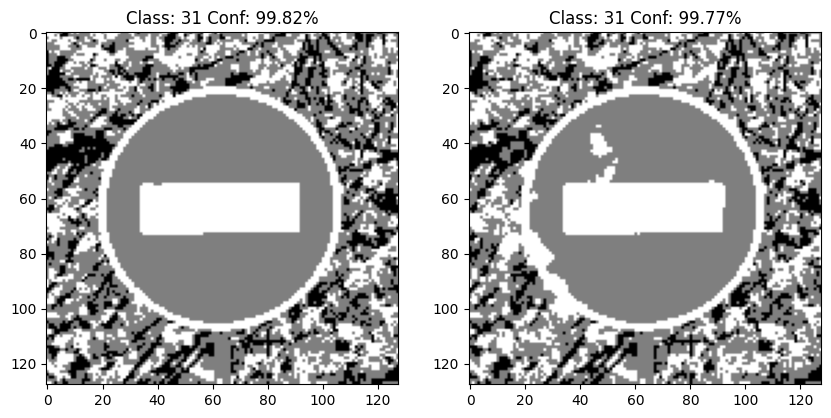

In [94]:
"""
3.5 Demo of ZOO optimize result + Контраст и цветовая палитра (исправлено)
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

# --- Функция для изменения цветовой палитры ---
def transform_color_palette(img):
    """
    Преобразует изображение в оттенки серого, повышает контрастность с помощью CLAHE
    и изменяет цветовую палитру на черный-серый-белый.

    Args:
        img (numpy.ndarray): Исходное изображение в формате BGR.

    Returns:
        numpy.ndarray: Изображение с измененной цветовой палитрой.
    """
    # 1. Convert to grayscale
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 2. Enhance contrast (using CLAHE)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    # Scale to 0-255 and convert to uint8 for CLAHE
    gray_img_scaled = (gray_img * 255).clip(0, 255).astype(np.uint8)

    contrast_enhanced_img = clahe.apply(gray_img_scaled)

    # 3. Change the color palette
    # Create a 3-channel image
    color_transformed_img = np.zeros((contrast_enhanced_img.shape[0], contrast_enhanced_img.shape[1], 3), dtype=np.uint8)

    # Normalize values to 0-1 range
    normalized_img = contrast_enhanced_img / 255.0

    # Apply the color transformation rules
    color_transformed_img[normalized_img <= 0.2] = [0, 0, 0]  # Black for brightness 0-10%
    color_transformed_img[(normalized_img > 0.2) & (normalized_img <= 0.6)] = [127, 127, 127]  # Gray for brightness 10-50%
    color_transformed_img[normalized_img > 0.6] = [255, 255, 255]  # White for brightness 50-100%

    return color_transformed_img

# --- Основной код ---

# Transform color palette for both original and attacked images
color_transformed_test_img = transform_color_palette(test_img)
color_transformed_attack_img = transform_color_palette(ZOO_optimizer.attack_img)

# 4. Re-evaluate with the transformed image (attacked image)
classifier.eval()
resize_img = cv2.resize(color_transformed_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)

predict_transformed = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_transformed = torch.argmax(predict_transformed)
confidence_transformed = predict_transformed[index_transformed].item()

# Prediction for original image

resize_img = cv2.resize(color_transformed_test_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)

predict_original = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_original = torch.argmax(predict_original)
confidence_original = predict_original[index_original].item()


plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_original],confidence_original*100))
plt.imshow(cv2.cvtColor(color_transformed_test_img, cv2.COLOR_BGR2RGB))

plt.subplot(122)
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_transformed], confidence_transformed*100))
plt.imshow(cv2.cvtColor(color_transformed_attack_img, cv2.COLOR_BGR2RGB))  # Display as RGB

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/color_transformed_sim_light.png', color_transformed_attack_img)
cv2.imwrite('workspace/color_transformed_test_img.png', color_transformed_test_img)

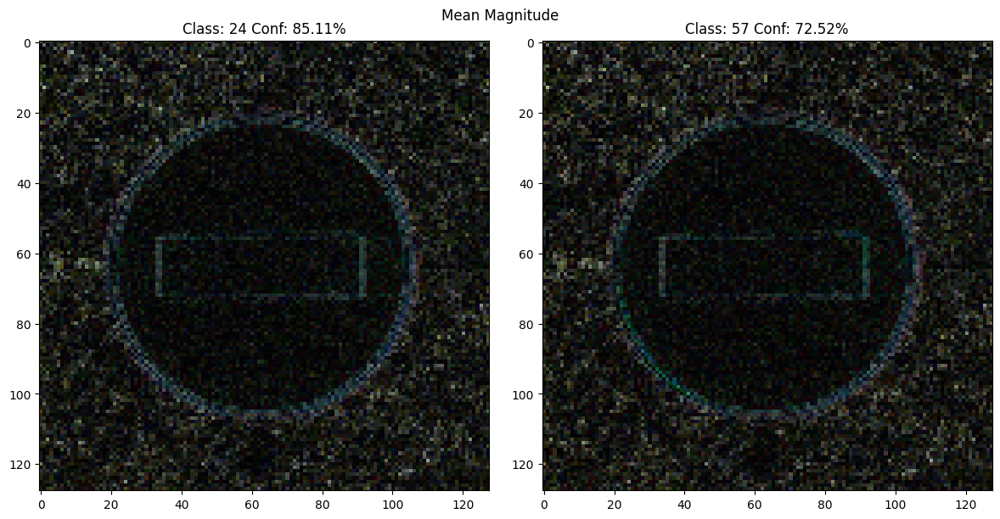

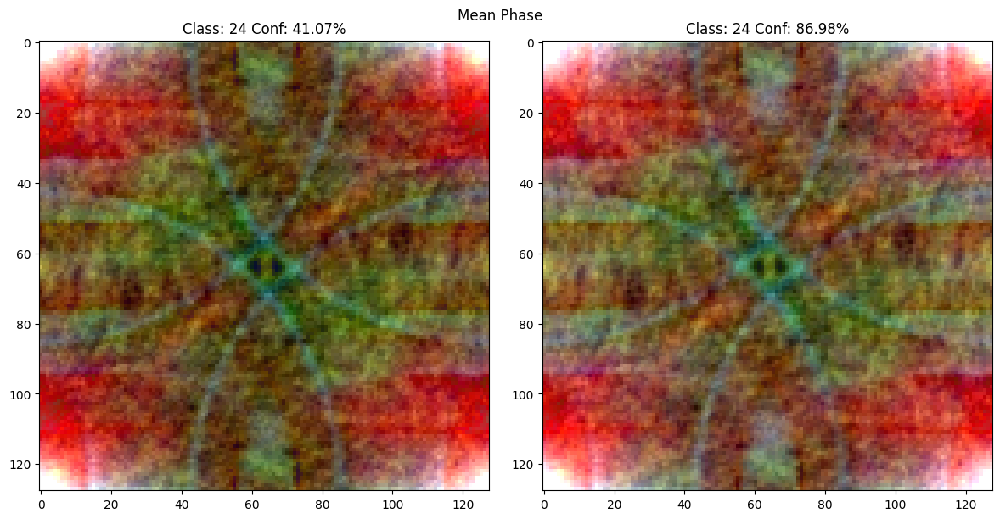

True

In [ ]:
"""
3.5 Demo of ZOO optimize result + преобразование Фурье (без чб)
"""
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision
from PIL import Image  # Import PIL


# --- Функция для применения преобразования Фурье и обработки ---
def apply_fourier_transform(img):
    """
    Выполняет преобразование Фурье для каждого канала изображения,
    обрабатывает амплитуду и фазу и возвращает преобразованное изображение.

    Args:
        img (numpy.ndarray): Исходное изображение в формате BGR.

    Returns:
        tuple: (изображение с усредненной амплитудой, изображение с усредненной фазой)
    """
    # 1. Split channels
    b, g, r = cv2.split(img)

    # 2. Fourier Transform for each channel
    f_b = np.fft.fft2(b)
    f_g = np.fft.fft2(g)
    f_r = np.fft.fft2(r)

    fshift_b = np.fft.fftshift(f_b)
    fshift_g = np.fft.fftshift(f_g)
    fshift_r = np.fft.fftshift(f_r)

    # 3. Calculate magnitude and phase for each channel
    magnitude_b = np.abs(fshift_b)
    phase_b = np.angle(fshift_b)

    magnitude_g = np.abs(fshift_g)
    phase_g = np.angle(fshift_g)

    magnitude_r = np.abs(fshift_r)
    phase_r = np.angle(fshift_r)

    # 4. Calculate mean magnitude and phase for each channel
    mean_magnitude_b = np.mean(magnitude_b)
    mean_phase_b = np.mean(phase_b)

    mean_magnitude_g = np.mean(magnitude_g)
    mean_phase_g = np.mean(phase_g)

    mean_magnitude_r = np.mean(magnitude_r)
    mean_phase_r = np.mean(phase_r)

    # 5. Create images with mean magnitude and mean phase for each channel
    # Image with mean magnitude
    fshift_mean_mag_b = fshift_b.copy()
    fshift_mean_mag_g = fshift_g.copy()
    fshift_mean_mag_r = fshift_r.copy()

    fshift_mean_mag_b[:] = (mean_magnitude_b * fshift_b[:] / np.abs(fshift_b[:]))  # keep the phase
    fshift_mean_mag_g[:] = (mean_magnitude_g * fshift_g[:] / np.abs(fshift_g[:]))  # keep the phase
    fshift_mean_mag_r[:] = (mean_magnitude_r * fshift_r[:] / np.abs(fshift_r[:]))  # keep the phase

    # Image with mean phase
    fshift_mean_phase_b = fshift_b.copy()
    fshift_mean_phase_g = fshift_g.copy()
    fshift_mean_phase_r = fshift_r.copy()

    fshift_mean_phase_b[:] = np.abs(fshift_b[:]) * np.exp(1j * mean_phase_b)  # keep the magnitude
    fshift_mean_phase_g[:] = np.abs(fshift_g[:]) * np.exp(1j * mean_phase_g)  # keep the magnitude
    fshift_mean_phase_r[:] = np.abs(fshift_r[:]) * np.exp(1j * mean_phase_r)  # keep the magnitude




    # 6. Inverse Fourier Transform for each channel
    # Mean Magnitude
    f_ishift_mag_b = np.fft.ifftshift(fshift_mean_mag_b)
    img_back_mag_b = np.fft.ifft2(f_ishift_mag_b)
    img_back_mag_b = np.abs(img_back_mag_b)

    f_ishift_mag_g = np.fft.ifftshift(fshift_mean_mag_g)
    img_back_mag_g = np.fft.ifft2(f_ishift_mag_g)
    img_back_mag_g = np.abs(img_back_mag_g)

    f_ishift_mag_r = np.fft.ifftshift(fshift_mean_mag_r)
    img_back_mag_r = np.fft.ifft2(f_ishift_mag_r)
    img_back_mag_r = np.abs(img_back_mag_r)

    # Mean Phase
    f_ishift_phase_b = np.fft.ifftshift(fshift_mean_phase_b)
    img_back_phase_b = np.fft.ifft2(f_ishift_phase_b)
    img_back_phase_b = np.abs(img_back_phase_b)

    f_ishift_phase_g = np.fft.ifftshift(fshift_mean_phase_g)
    img_back_phase_g = np.fft.ifft2(f_ishift_phase_g)
    img_back_phase_g = np.abs(img_back_phase_g)

    f_ishift_phase_r = np.fft.ifftshift(fshift_mean_phase_r)
    img_back_phase_r = np.fft.ifft2(f_ishift_phase_r)
    img_back_phase_r = np.abs(img_back_phase_r)

    # 7. Merge channels
    img_back_mag = cv2.merge((img_back_mag_b, img_back_mag_g, img_back_mag_r))
    img_back_phase = cv2.merge((img_back_phase_b, img_back_phase_g, img_back_phase_r))


    # 8. Scale to 0-1
    #img_back_mag = (img_back_mag - np.min(img_back_mag)) / (np.max(img_back_mag) - np.min(img_back_mag))  # Scale to 0-1
    #img_back_phase = (img_back_phase - np.min(img_back_phase)) / (np.max(img_back_phase) - np.min(img_back_phase))  # Scale to 0-1

    return img_back_mag, img_back_phase


# --- Основной код ---

# Apply Fourier Transform and processing to both original and attacked images
test_img_mag, test_img_phase = apply_fourier_transform(test_img)
attack_img_mag, attack_img_phase = apply_fourier_transform(ZOO_optimizer.attack_img)

# --- Prediction ---
# Function to prepare image for classifier
def prepare_image(img):
    img = (img * 255).clip(0, 255).astype(np.uint8)
    # No grayscale conversion here!
    resize_img = cv2.resize(img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
    tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)
    return tensor_img

# Predictions for each image (mean magnitude, mean phase)
classifier.eval()

#test_img_mag
tensor_img = prepare_image(test_img_mag)
predict_test_mag = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_test_mag = torch.argmax(predict_test_mag)
confidence_test_mag = predict_test_mag[index_test_mag].item()

#test_img_phase
tensor_img = prepare_image(test_img_phase)
predict_test_phase = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_test_phase = torch.argmax(predict_test_phase)
confidence_test_phase = predict_test_phase[index_test_phase].item()

#attack_img_mag
tensor_img = prepare_image(attack_img_mag)
predict_attack_mag = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_attack_mag = torch.argmax(predict_attack_mag)
confidence_attack_mag = predict_attack_mag[index_attack_mag].item()

#attack_img_phase
tensor_img = prepare_image(attack_img_phase)
predict_attack_phase = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_attack_phase = torch.argmax(predict_attack_phase)
confidence_attack_phase = predict_attack_phase[index_attack_phase].item()


# --- Display Results ---
plt.figure(figsize=(12, 6))
plt.suptitle("Mean Magnitude")

# Original Image
plt.subplot(121)
plt.title("Original Image (Mean Magnitude)")
plt.imshow(cv2.cvtColor((test_img_mag*255).clip(0,255).astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_test_mag],confidence_test_mag*100))

# Attacked Image
plt.subplot(122)
plt.title("Attacked Image (Mean Magnitude)")
plt.imshow(cv2.cvtColor((attack_img_mag*255).clip(0,255).astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_attack_mag], confidence_attack_mag*100))

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.suptitle("Mean Phase")

# Original Image
plt.subplot(121)
plt.title("Original Image (Mean Phase)")
plt.imshow(cv2.cvtColor((test_img_phase*255).clip(0,255).astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_test_phase],confidence_test_phase*100))

# Attacked Image
plt.subplot(122)
plt.title("Attacked Image (Mean Phase)")
plt.imshow(cv2.cvtColor((attack_img_phase*255).clip(0,255).astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_attack_phase], confidence_attack_phase*100))

plt.tight_layout()
plt.show()



True

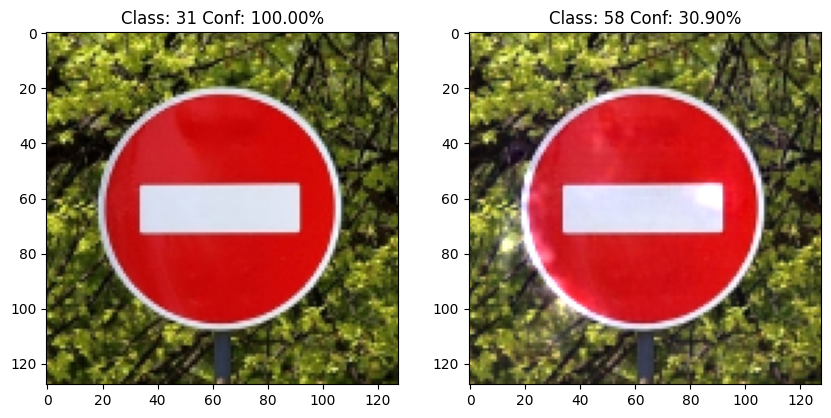

In [96]:
#просто вывод
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

# 1. Convert to HSV
hsv_attack_img = cv2.cvtColor(ZOO_optimizer.attack_img, cv2.COLOR_BGR2HSV)

# 4. Re-evaluate with the transformed image - just use the enhanced HSV
color_transformed_img_bgr = cv2.cvtColor(hsv_attack_img, cv2.COLOR_HSV2BGR)  # Convert back to BGR for display

# Масштабируем значения и преобразуем в uint8 перед отображением
if color_transformed_img_bgr.max() <= 1.0:  # Проверяем, что данные в диапазоне 0-1
    color_transformed_img_bgr = (color_transformed_img_bgr * 255).clip(0, 255).astype(np.uint8)

classifier.eval()
resize_img = cv2.resize(color_transformed_img_bgr, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)

predict_transformed = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)

index_transformed = torch.argmax(predict_transformed)
confidence_transformed = predict_transformed[index_transformed].item()

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

plt.subplot(122)
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_transformed], confidence_transformed*100))
plt.imshow(cv2.cvtColor(color_transformed_img_bgr, cv2.COLOR_BGR2RGB) / 255.0)  # Display as RGB

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/color_transformed_sim_light.png', color_transformed_img_bgr)

58
Confidence: 31.199362874031067 %
best pos [np.int16(59), np.int16(86), np.int16(10)]
Largest Loss 2.9364218711853027


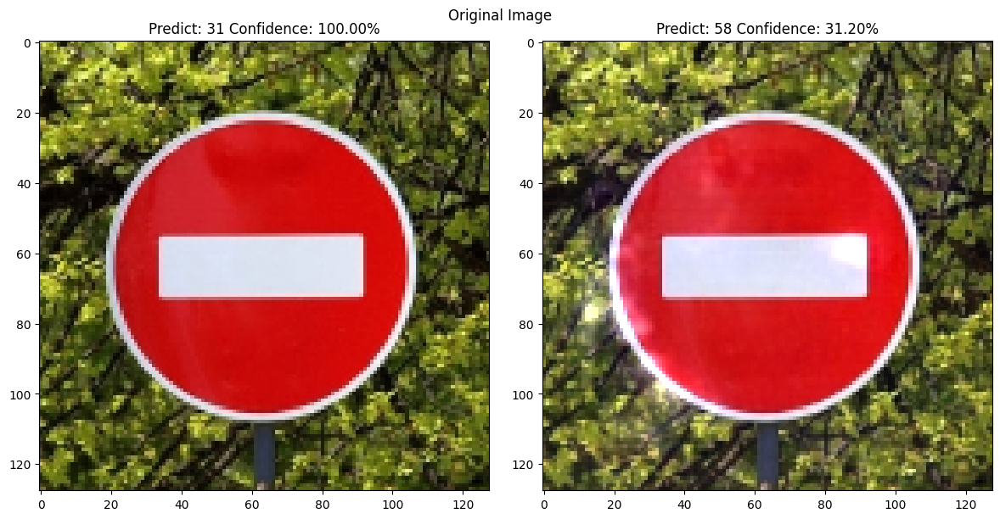

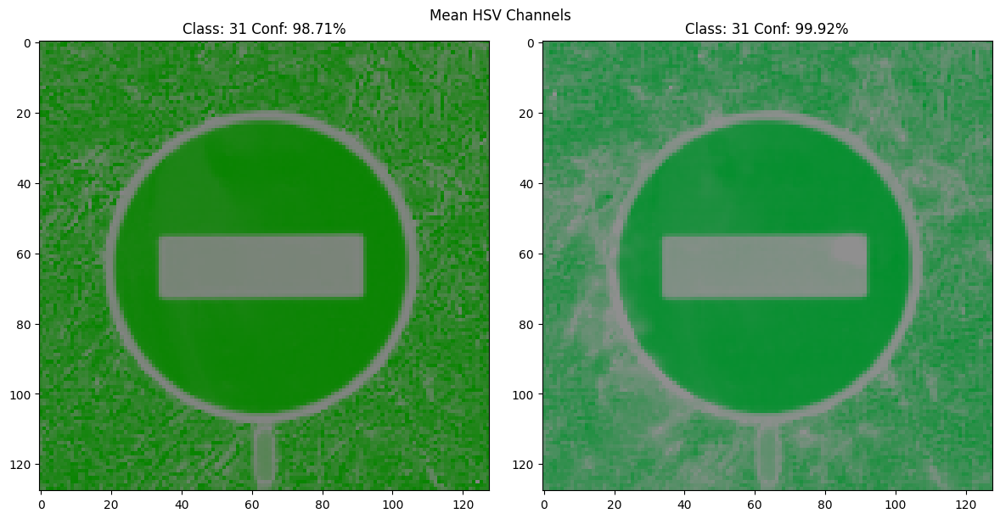

True

In [97]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision
from PIL import Image  # Import PIL


# --- Функции для расчета и применения усредненного HSV  ---
def apply_mean_hsv_channels(image_bgr):
    """
    Преобразует изображение в HSV, вычисляет среднее значение для каждого канала (H, S, V),
    заменяет все значения каналов на их средние значения и возвращает изображение в BGR.

    Args:
        image_bgr (numpy.ndarray): Исходное изображение в формате BGR.

    Returns:
        numpy.ndarray: Изображение BGR с усредненными каналами HSV.
    """
    hsv_image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    # Вычисляем средние значения для каждого канала
    mean_h = np.mean(hsv_image[:, :, 0])
    #mean_s = np.mean(hsv_image[:, :, 1])
    mean_v = np.mean(hsv_image[:, :, 2])

    # Заменяем значения каналов на средние
    hsv_image[:, :, 0] = mean_h
    #hsv_image[:, :, 1] = mean_s
    hsv_image[:, :, 2] = mean_v

    return cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)


def predict_image(image, model, device, transform):
    """
    Предобрабатывает изображение и делает предсказание.

    Args:
        image (numpy.ndarray): Исходное изображение в формате BGR (OpenCV).
        model (torch.nn.Module):  Ваша модель.
        device (torch.device):  Устройство ('cpu' or 'cuda').
        transform (torchvision.transforms.Compose): Преобразования для предобработки.

    Returns:
        tuple: (predicted_class, confidence) or (None, None) in case of error
    """
    try:
        # Преобразование изображения в формат PIL
        img = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # cv2 использует BGR, а PIL и model - RGB

        # Предобработка изображения (применяем transform, который мы использовали раньше!)
        img_tensor = transform(img).to(device)
        img_tensor = img_tensor.unsqueeze(0)  # Добавляем размерность пакета (batch size)

        # Получаем предсказание
        with torch.no_grad():
            output = model(img_tensor)
            _, predicted_class = torch.max(output.data, 1)
            confidence = F.softmax(output, dim=1)  # Use softmax to get probabilities
            confidence_score = confidence.max().item()

        return predicted_class.item(), confidence_score

    except Exception as e:
        print(f"Error predicting image: {e}")
        return None, None

# --- Основной код ---

# --- 3.5 Demo of ZOO optimize result ---
print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)

# 1. Convert to HSV
hsv_attack_img = cv2.cvtColor(ZOO_optimizer.attack_img, cv2.COLOR_BGR2HSV)

# 4. Re-evaluate with the transformed image - just use the enhanced HSV
color_transformed_img_bgr = cv2.cvtColor(hsv_attack_img, cv2.COLOR_HSV2BGR)  # Convert back to BGR for display

# Масштабируем значения и преобразуем в uint8 перед отображением
if color_transformed_img_bgr.max() <= 1.0:  # Проверяем, что данные в диапазоне 0-1
    color_transformed_img_bgr = (color_transformed_img_bgr * 255).clip(0, 255).astype(np.uint8)


# --- Applying Mean HSV Channels ---
# Для оригинального изображения (test_img больше не используется, используем test_img для сравнения)
test_img_mean_hsv = apply_mean_hsv_channels(test_img)  # test_img - оригинальное изображение (BGR)

# Для атакованного изображения
color_transformed_img_bgr_mean_hsv = apply_mean_hsv_channels(color_transformed_img_bgr)

# --- Prediction with Mean HSV Channels ---
# Original Image
classifier.eval()
resize_img = cv2.resize(test_img_mean_hsv, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)
predict_original_mean_hsv = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_original_mean_hsv = torch.argmax(predict_original_mean_hsv)
confidence_original_mean_hsv = predict_original_mean_hsv[index_original_mean_hsv].item()

# Attacked Image
resize_img = cv2.resize(color_transformed_img_bgr_mean_hsv, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)
predict_transformed_mean_hsv = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_transformed_mean_hsv = torch.argmax(predict_transformed_mean_hsv)
confidence_transformed_mean_hsv = predict_transformed_mean_hsv[index_transformed_mean_hsv].item()



# --- Display Results - Plot 1: Original Image ---
plt.figure(figsize=(12, 6))
plt.suptitle("Original Image")

# Original Image
plt.subplot(121)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[index],confidence*100))
plt.imshow(test_img[:,:,::-1])

# Attacked Image (Original Transformation)
plt.subplot(122)
plt.title("Predict: {} Confidence: {:.2f}%".format(LABELS[ZOO_optimizer.predict], ZOO_optimizer.confidence.item()*100))
plt.imshow(ZOO_optimizer.attack_img[:,:,::-1])


plt.tight_layout()
plt.show()

# --- Display Results - Plot 2: Mean HSV Channels ---
plt.figure(figsize=(12, 6))
plt.suptitle("Mean HSV Channels")

# Original Image with Mean HSV
plt.subplot(121)
plt.title("Original Image (Mean HSV)")
plt.imshow(cv2.cvtColor(test_img_mean_hsv, cv2.COLOR_BGR2RGB))
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_original_mean_hsv], confidence_original_mean_hsv*100))

# Attacked Image with Mean HSV
plt.subplot(122)
plt.title("Attacked Image (Mean HSV)")
plt.imshow(cv2.cvtColor(color_transformed_img_bgr_mean_hsv, cv2.COLOR_BGR2RGB) / 255.0)  # Display as RGB
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_transformed_mean_hsv], confidence_transformed_mean_hsv*100))

plt.tight_layout()
plt.show()


# Save Images
cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/color_transformed_sim_light.png', color_transformed_img_bgr)
cv2.imwrite('workspace/test_img_mean_hsv.png', test_img_mean_hsv)
cv2.imwrite('workspace/color_transformed_img_bgr_mean_hsv.png', color_transformed_img_bgr_mean_hsv)

V channel min: 0.003921568859368563, max: 1.0 before processing
V channel min: 0.00313725508749485, max: 0.800000011920929 after darkening
V channel min: 0.02651960961520672, max: 0.7714216113090515 after blurring
H channel min: 0.0, max: 359.71429443359375 before processing
H channel min: 61.80152893066406, max: 297.78662109375 after processing
V channel min: 0.039712417870759964, max: 1.0 before processing
V channel min: 0.03176993504166603, max: 0.800000011920929 after darkening
V channel min: 0.057515740394592285, max: 0.8000000715255737 after blurring
H channel min: 0.0, max: 359.99981689453125 before processing
H channel min: 59.84703826904297, max: 329.6391906738281 after processing


True

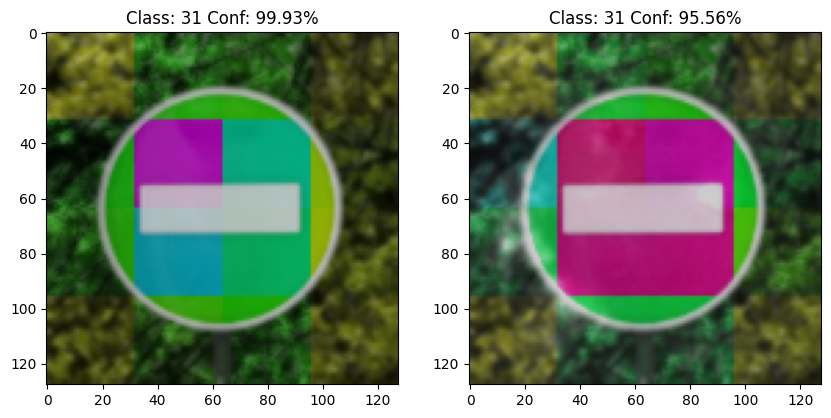

: 

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision

# Функция для обработки канала V (затемнение и размытие)
def process_v_channel(hsv_img):
    v_channel = hsv_img[:, :, 2].astype(np.float32)  # Convert to float32
    print(f"V channel min: {np.min(v_channel)}, max: {np.max(v_channel)} before processing") # Debugging
    # Затемнение
    v_channel = (v_channel * 0.8)  # Затемнение на 20%
    print(f"V channel min: {np.min(v_channel)}, max: {np.max(v_channel)} after darkening") # Debugging
    # Размытие по Гауссу
    v_channel = cv2.GaussianBlur(v_channel, (5, 5), 0) # kernel size 5x5, sigma=0
    print(f"V channel min: {np.min(v_channel)}, max: {np.max(v_channel)} after blurring") # Debugging
    return v_channel

# Функция для обработки канала H (разбиение на квадраты и усреднение)
def process_h_channel(hsv_img):
    h_channel = hsv_img[:, :, 0].astype(np.float32)  # Convert to float32
    print(f"H channel min: {np.min(h_channel)}, max: {np.max(h_channel)} before processing") # Debugging
    height, width = h_channel.shape
    square_size = 32
    for y in range(0, height, square_size):
        for x in range(0, width, square_size):
            # Определяем границы квадрата
            y_max = min(y + square_size, height)
            x_max = min(x + square_size, width)

            # Выделяем квадрат
            square = h_channel[y:y_max, x:x_max]

            # Вычисляем среднее значение H для квадрата
            mean_h = np.mean(square)

            # Закрашиваем квадрат средним значением
            h_channel[y:y_max, x:x_max] = mean_h
    print(f"H channel min: {np.min(h_channel)}, max: {np.max(h_channel)} after processing") # Debugging
    return h_channel

# --- Обработка изображений ---

# Обработка исходного изображения (test_img)
hsv_test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2HSV).astype(np.float32)  # Convert to float32 and BGR2HSV
hsv_test_img[:, :, 2] = process_v_channel(hsv_test_img)  # Обработка канала V
hsv_test_img[:, :, 0] = process_h_channel(hsv_test_img)  # Обработка канала H

# Clip values after processing V and H channels to be sure they are within range for HSV
hsv_test_img[:, :, 0] = np.clip(hsv_test_img[:, :, 0], 0, 360)
hsv_test_img[:, :, 1] = np.clip(hsv_test_img[:, :, 1], 0, 1)
hsv_test_img[:, :, 2] = np.clip(hsv_test_img[:, :, 2], 0, 1)

color_transformed_test_img_bgr = cv2.cvtColor(hsv_test_img.astype(np.float32), cv2.COLOR_HSV2BGR)  # Convert back to BGR


# Обработка атакованного изображения (ZOO_optimizer.attack_img)
hsv_attack_img = cv2.cvtColor(ZOO_optimizer.attack_img, cv2.COLOR_BGR2HSV).astype(np.float32) # Convert to float32 and BGR2HSV
hsv_attack_img[:, :, 2] = process_v_channel(hsv_attack_img)  # Обработка канала V
hsv_attack_img[:, :, 0] = process_h_channel(hsv_attack_img)  # Обработка канала H

# Clip values after processing V and H channels to be sure they are within range for HSV
hsv_attack_img[:, :, 0] = np.clip(hsv_attack_img[:, :, 0], 0, 360)
hsv_attack_img[:, :, 1] = np.clip(hsv_attack_img[:, :, 1], 0, 1)
hsv_attack_img[:, :, 2] = np.clip(hsv_attack_img[:, :, 2], 0, 1)

color_transformed_img_bgr = cv2.cvtColor(hsv_attack_img.astype(np.float32), cv2.COLOR_HSV2BGR)  # Convert back to BGR


# Масштабируем значения и преобразуем в uint8 перед отображением (для test_img)
color_transformed_test_img_bgr = (color_transformed_test_img_bgr * 255).clip(0, 255).astype(np.uint8)


# Масштабируем значения и преобразуем в uint8 перед отображением (для color_transformed_img_bgr - attack_img)
color_transformed_img_bgr = (color_transformed_img_bgr * 255).clip(0, 255).astype(np.uint8)

# ---  Предсказание  ---

classifier.eval()

# Для обработанного исходного изображения
resize_img_test = cv2.resize(color_transformed_test_img_bgr, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img_test = torchvision.transforms.ToTensor()(resize_img_test).unsqueeze(0).to(device)
predict_test = torch.softmax(classifier.forward(tensor_img_test).squeeze(), dim=-1)
index_test = torch.argmax(predict_test)
confidence_test = predict_test[index_test].item()

# Для обработанного атакованного изображения
resize_img = cv2.resize(color_transformed_img_bgr, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)
predict_transformed = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_transformed = torch.argmax(predict_transformed)
confidence_transformed = predict_transformed[index_transformed].item()

# --- Отображение и сохранение ---

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_test], confidence_test*100)) # Use test_img prediction
plt.imshow(cv2.cvtColor(color_transformed_test_img_bgr, cv2.COLOR_BGR2RGB) / 255.0)  # Display as RGB

plt.subplot(122)
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_transformed], confidence_transformed*100))
plt.imshow(cv2.cvtColor(color_transformed_img_bgr, cv2.COLOR_BGR2RGB) / 255.0)  # Display as RGB

cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/color_transformed_sim_light.png', color_transformed_img_bgr)
cv2.imwrite('workspace/color_transformed_test_img.png', color_transformed_test_img_bgr)

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision
from PIL import Image  # Import PIL


def process_hsv(image_bgr, method="invert_median", ksize=3, clipLimit=2.0, tileGridSize=(8, 8)):
    """
    Обрабатывает изображение в HSV с использованием различных методов.

    Args:
        image_bgr (numpy.ndarray): Исходное изображение в формате BGR.
        method (str): Метод обработки: "invert", "median", "clahe", "invert_median".
        ksize (int): Размер ядра для медианной фильтрации.
        clipLimit (float): Параметр clipLimit для CLAHE.
        tileGridSize (tuple): Параметр tileGridSize для CLAHE.

    Returns:
        numpy.ndarray: Обработанное изображение BGR.
    """
    hsv_image = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv_image)

    if method == "invert":
        h = 180 - h  # Диапазон H: 0-180
        s = 255 - s
        v = 255 - v
    elif method == "median":
        h = cv2.medianBlur(h, ksize=ksize)
        s = cv2.medianBlur(s, ksize=ksize)
        v = cv2.medianBlur(v, ksize=ksize)
    elif method == "clahe":
        clahe = cv2.createCLAHE(clipLimit=clipLimit, tileGridSize=tileGridSize)
        v = clahe.apply(v)
    elif method == "invert_median":
        h = 180 - h
        s = 255 - s
        v = 255 - v
        h = cv2.medianBlur(h, ksize=ksize)
        s = cv2.medianBlur(s, ksize=ksize)
        v = cv2.medianBlur(v, ksize=ksize)
    # Добавьте else if method == "median_clahe":  ... и т.д. для других комбинаций

    hsv_image = cv2.merge((h, s, v))
    return cv2.cvtColor(hsv_image, cv2.COLOR_HSV2BGR)


def predict_image(image, model, device, transform):
    """
    Предобрабатывает изображение и делает предсказание.

    Args:
        image (numpy.ndarray): Исходное изображение в формате BGR (OpenCV).
        model (torch.nn.Module):  Ваша модель.
        device (torch.device):  Устройство ('cpu' or 'cuda').
        transform (torchvision.transforms.Compose): Преобразования для предобработки.

    Returns:
        tuple: (predicted_class, confidence) or (None, None) in case of error
    """
    try:
        # Преобразование изображения в формат PIL
        img = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))  # cv2 использует BGR, а PIL и model - RGB

        # Предобработка изображения (применяем transform, который мы использовали раньше!)
        img_tensor = transform(img).to(device)
        img_tensor = img_tensor.unsqueeze(0)  # Добавляем размерность пакета (batch size)

        # Получаем предсказание
        with torch.no_grad():
            output = model(img_tensor)
            _, predicted_class = torch.max(output.data, 1)
            confidence = F.softmax(output, dim=1)  # Use softmax to get probabilities
            confidence_score = confidence.max().item()

        return predicted_class.item(), confidence_score

    except Exception as e:
        print(f"Error predicting image: {e}")
        return None, None


# --- Основной код ---

# --- 3.5 Demo of ZOO optimize result ---
print(LABELS[ZOO_optimizer.predict])
print(f"Confidence: {ZOO_optimizer.confidence.item()*100} %")
print("best pos", ZOO_optimizer.global_best_pos)
print("Largest Loss",ZOO_optimizer.global_best_value)


#  Применяем обработку к изображениям
processed_test_img = process_hsv(test_img, method="invert_median", ksize=3)  # или другой метод
processed_attack_img = process_hsv(ZOO_optimizer.attack_img, method="invert_median", ksize=3)

# --- Prediction ---
# Original Image with Processed HSV
classifier.eval()
resize_img = cv2.resize(processed_test_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)
predict_original_processed = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_original_processed = torch.argmax(predict_original_processed)
confidence_original_processed = predict_original_processed[index_original_processed].item()

# Attacked Image with Processed HSV
resize_img = cv2.resize(processed_attack_img, CLASSIFIER_INPUT_SHAPE, interpolation=cv2.INTER_CUBIC)
tensor_img = torchvision.transforms.ToTensor()(resize_img).unsqueeze(0).to(device)
predict_transformed_processed = torch.softmax(classifier.forward(tensor_img).squeeze(), dim=-1)
index_transformed_processed = torch.argmax(predict_transformed_processed)
confidence_transformed_processed = predict_transformed_processed[index_transformed_processed].item()


# --- Display Results ---
plt.figure(figsize=(12, 6))
plt.suptitle("Processed Image")

# Original Image
plt.subplot(121)
plt.title("Original Image (Processed)")
plt.imshow(cv2.cvtColor(processed_test_img, cv2.COLOR_BGR2RGB))
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_original_processed], confidence_original_processed*100))

# Attacked Image
plt.subplot(122)
plt.title("Attacked Image (Processed)")
plt.imshow(cv2.cvtColor(processed_attack_img, cv2.COLOR_BGR2RGB) / 255.0)  # Display as RGB
plt.title("Class: {} Conf: {:.2f}%".format(LABELS[index_transformed_processed], confidence_transformed_processed*100))


plt.tight_layout()
plt.show()


# Save Images
cv2.imwrite('workspace/sim_light.png', (ZOO_optimizer.attack_img*255).clip(0,255).astype("uint8"))
cv2.imwrite('workspace/test_img_processed.png', processed_test_img)
cv2.imwrite('workspace/attack_img_processed.png', processed_attack_img)

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

def display_hsv_layers(image, title):
    """
    Отображает каналы HSV для заданного изображения.

    Args:
        image: Изображение в формате BGR (OpenCV).
        title: Заголовок для отображения.
    """
    hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv_img)

    plt.figure(figsize=(12, 4))  # Создаем новую фигуру для каждого изображения

    plt.subplot(131)
    plt.imshow(h, cmap='hsv')  # Hue
    plt.title(f"{title} - Hue")

    plt.subplot(132)
    plt.imshow(s, cmap='gray')  # Saturation
    plt.title(f"{title} - Saturation")

    plt.subplot(133)
    plt.imshow(v, cmap='gray')  # Value
    plt.title(f"{title} - Value")

    plt.suptitle(f"HSV Channels - {title}")
    plt.tight_layout()
    plt.show()


def display_hsv_layers_for_attack(original_image_path, attack_image):
    """
    Отображает каналы HSV для исходного и атакованного изображений.

    Args:
        original_image_path: Путь к исходному изображению.
        attack_image: Атакованное изображение (в формате BGR или [0,1]).
    """
    # Загрузка исходного изображения
    original_img = original_image_path

    if original_img is None:
        print(f"Не удалось загрузить исходное изображение по пути: {original_image_path}")
        return

    # Отображение каналов HSV для оригинального изображения
    display_hsv_layers(original_img, "Original")

    # Преобразование атакованного изображения в формат BGR, если это необходимо.
    if attack_image is not None: #check for none
        if attack_image.max() <= 1.0:  # If it is normalized
          attack_img = (attack_image * 255).clip(0, 255).astype(np.uint8) # scale it
        else:
          attack_img = attack_image.astype(np.uint8) # assuming its in BGR
        display_hsv_layers(attack_img, "Attacked")
    else:
        print("No attack image provided.")


# Пример использования
image_path = test_img  # Путь к вашему исходному изображению
# Замените ZOO_optimizer.attack_img на ваше атакованное изображение
# Убедитесь, что attack_image либо путь к изображению, либо ndarray в BGR формате или [0,1]
# Для примера, создадим фейковое атакованное изображение
attack_image = ZOO_optimizer.attack_img # this is a placeholder, replace with your attack_image
display_hsv_layers_for_attack(image_path, attack_image)

Original Image:


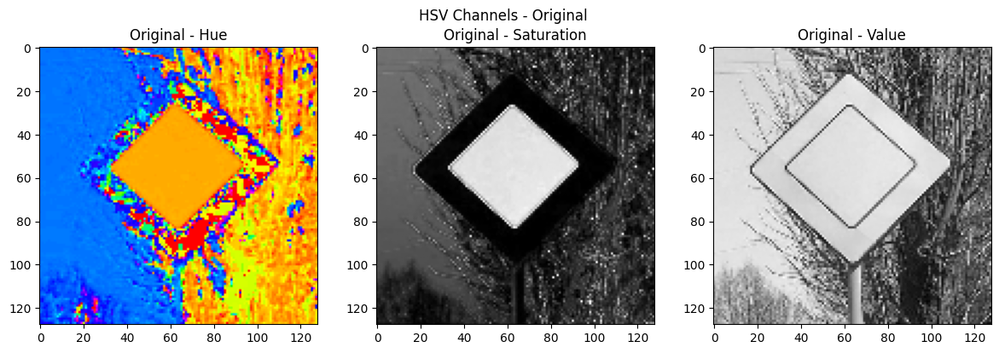

Predictions for Original HSV Channels:
  Channel H: Predicted Class = 24, Confidence = 0.8093
  Channel S: Predicted Class = 50, Confidence = 0.6178
  Channel V: Predicted Class = 50, Confidence = 0.6178

Attacked Image:


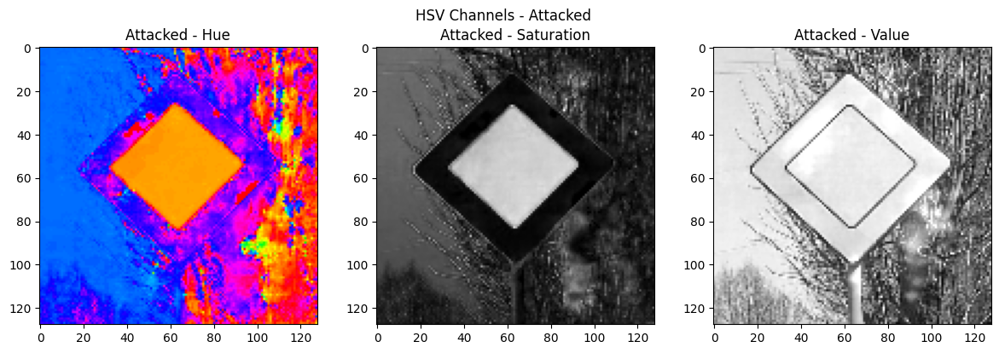

Predictions for Attacked HSV Channels:
  Channel H: Predicted Class = 44, Confidence = 0.4276
  Channel S: Predicted Class = 84, Confidence = 0.9331
  Channel V: Predicted Class = 24, Confidence = 0.9874


In [76]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from PIL import Image
import torch.nn.functional as F


# 1. Функция для предобработки изображения и получения предсказаний
def predict_hsv_channels(image, model, device, transform, original_image_path=""):

    try:
        # Преобразование в HSV
        hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
        h, s, v = cv2.split(hsv_img)

        # Получаем предсказания для каждого канала
        predictions = []
        for channel, channel_name in zip([h, s, v], ["H", "S", "V"]):
            # Преобразование канала в формат PIL (как исходное изображение)
            # Так как каналы - это Grayscale images
            channel_img = Image.fromarray(channel) # Преобразуем в PIL image

            # Преобразование изображения в тензор PyTorch и добавление канала
            # Изменяем здесь:
            transform_with_channel = transforms.Compose([
                transforms.Resize(CLASSIFIER_INPUT_SHAPE),
                transforms.Grayscale(num_output_channels=3), # Преобразование в 3-канальное Grayscale
                transforms.ToTensor(),
                # Если использовалась нормализация:
                #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Ваша нормализация
            ])
            img_tensor = transform_with_channel(channel_img).to(device)
            img_tensor = img_tensor.unsqueeze(0)  # Добавляем размерность пакета (batch size)

            # Получаем предсказание
            with torch.no_grad():
                output = model(img_tensor)
                _, predicted_class = torch.max(output.data, 1)
                confidence = F.softmax(output, dim=1)
                confidence_score = confidence.max().item()

            predictions.append((predicted_class.item(), confidence_score))
            #print(f"Channel {channel_name} Predicted Class: {predicted_class.item()}, Confidence: {confidence_score:.4f}") #debug

        return predictions

    except Exception as e:
        print(f"Error predicting HSV channels: {e}")
        print(f"Path to original image: {original_image_path}")  # Для отладки
        return None


# 2. Функция для отображения и анализа HSV каналов (модифицированная)
def display_hsv_layers_for_attack_and_predict(original_image, attack_image, model, device, transform, original_image_path=""):

    # 1. Обработка исходного изображения
    print("Original Image:")
    display_hsv_layers(original_image, "Original")
    original_predictions = predict_hsv_channels(original_image, model, device, transform, original_image_path=original_image_path)
    if original_predictions:
      print("Predictions for Original HSV Channels:")
      for i, (pred_class, confidence) in enumerate(original_predictions):
          print(f"  Channel {['H', 'S', 'V'][i]}: Predicted Class = {pred_class}, Confidence = {confidence:.4f}")

    # 2. Обработка атакованного изображения
    if attack_image is not None:
        print("\nAttacked Image:")
        if attack_image.max() <= 1.0:  # Если это нормализованное изображение
            attack_img = (attack_image * 255).clip(0, 255).astype(np.uint8)  # scale it
        else:
            attack_img = attack_image.astype(np.uint8) # assuming its in BGR
        display_hsv_layers(attack_img, "Attacked")
        attack_predictions = predict_hsv_channels(attack_img, model, device, transform, original_image_path=original_image_path)  # передаем путь для отладки
        if attack_predictions:
            print("Predictions for Attacked HSV Channels:")
            for i, (pred_class, confidence) in enumerate(attack_predictions):
                print(f"  Channel {['H', 'S', 'V'][i]}: Predicted Class = {pred_class}, Confidence = {confidence:.4f}")
    else:
        print("No attack image provided.")


image_path = "workspace_physical/saratov.jpg" # Путь к вашему изображению
display_hsv_layers_for_attack_and_predict(test_img, ZOO_optimizer.attack_img, classifier, device, transform, image_path)